## Importing Libraries

In [1]:
import pandas as pd
import numpy as np
import math

import matplotlib.pyplot as plt
import seaborn as sns

import warnings
warnings.filterwarnings('ignore')

## Common functions

In [2]:
def annot_bar_plot(plots):
    for bar in plots.patches:
        plots.annotate(format(bar.get_height(), '.2f'),
                           (bar.get_x() + bar.get_width() / 2,
                            bar.get_height()), ha='center', va='center',
                           size=25, xytext=(0, 8),
                           textcoords='offset points')

In [3]:
def get_all_types(data):
    show_types = {}
    for i in data.columns:
        show_types[i] = data[i].dtypes
    return show_types    

def get_info(col_name, data):
    return data[col_name].isnull().sum(), data[col_name].dtypes

In [4]:
def plot_categorical(vars, data):
#     plt.figure(figsize=(10,100),facecolor='grey')
    plt.figure(figsize=(10,100))
    sns.set_style("dark")
    sns.set(color_codes=True)
    
    rows = len(vars)
    for i in range(len(vars)):
        plt.subplot(rows, 1, i+1)
        plots = sns.countplot(vars[i], data=data, order = data[vars[i]].value_counts(sort=False).index)
        annot_bar_plot(plots)
        plt.title(str(vars[i]))
        plt.xlabel(str(vars[i])+' Values')
        plt.ylabel('Count')
        plt.xticks(rotation=45)
        plt.yticks(rotation=45)

#     plt.subplots_adjust(hspace=0.5)
    plt.tight_layout()

def plot_quantitative(vars, data):
    plt.figure(figsize=(20,100),facecolor='grey')
    sns.set_style("dark")
    sns.set(color_codes=True)
    
    rows = math.ceil(len(vars)/2)
    for i in range(len(vars)):
        plt.subplot(rows, 2, i+1)
        sns.distplot(data[vars[i]], rug = True)        
        plt.title(str(vars[i]))
        plt.xlabel(str(vars[i])+' Values', fontsize=14)
        plt.ylabel('Distribution', fontsize=14)
        plt.xticks(rotation=45, fontsize=14)
        plt.yticks(rotation=45, fontsize=14)
#     plt.subplots_adjust(hspace=0.5)
    plt.tight_layout()
    

def plot_box(vars, data):
    plt.figure(figsize=(20,100),facecolor='grey')
    sns.set_style("dark")
    sns.set(color_codes=True)
    
    rows = math.ceil(len(vars)/2)
    for i in range(len(vars)):
        plt.subplot(rows, 2, i+1)
        sns.boxplot(data[vars[i]])        
        plt.title(str(vars[i]))
#         plt.xlabel(str(vars[i])+' Values', fontsize=14)
#         plt.ylabel('Distribution', fontsize=14)
#         plt.xticks(rotation=45, fontsize=14)
#         plt.yticks(rotation=45, fontsize=14)
#     plt.subplots_adjust(hspace=0.5)
    plt.tight_layout()

In [5]:
def percent_representation(columnames, dataframe):
    for i in columnames:
        print(f"\nFOR {i}\n")
        for name, value in zip(dataframe[i].value_counts().index, dataframe[i].value_counts().values):
            print(f"Count of {name} is {dataframe[i].value_counts()[name]} which represents about {round((value/dataframe.shape[0]) * 100, 3)} of {i}")

In [6]:
def plot_quan_cat(vars, data):
    sns.set_style("dark")
    sns.set(color_codes=True)
    rows = len(vars)
    plt.figure(figsize=(20, 100))

    for i in range(len(vars)):        
        plt.subplot(rows, 2, (2*i)+1)
        plots = sns.barplot(data=data, x=vars[i], y='SalePrice')
        plt.xticks(rotation=45)
        plt.yticks(rotation=45)
        
        plt.subplot(rows, 2, (2*i)+2)
        ax = sns.boxplot(x='SalePrice', y=vars[i], data=data, orient='h')
        plt.xticks(rotation=45)
        
    plt.tight_layout()
    
def plot_quan_quan(vars, data):
    sns.set_style("dark")
    sns.set(color_codes=True)
    
    rows = len(vars)
    plt.figure(figsize=(20, 100))
    for i in range(len(vars)):
        plt.subplot(rows, 2, (2*i)+1)
        sns.scatterplot(data=data, x=vars[i], y='SalePrice')  
        plt.subplot(rows, 2, (2*i)+2)
        sns.lineplot(data=data, x=vars[i], y='SalePrice')    

        plt.xticks(rotation=90)
        
    plt.subplots_adjust(wspace=0.2, hspace=0.5)

In [7]:
def getScatter(y, data, x='SalePrice'):
    plt.figure(figsize=(20, 200))
    for i in range(len(y)):
        plt.subplot(len(y), 2, (2*i)+1)
        plt.scatter(data[x], data[y[i]])
        plt.xlabel('Sale Price')
        plt.ylabel(y[i])
        plt.subplot(len(y), 2, (2*i)+2)
        sns.regplot(data[x], data[y[i]], line_kws={"color": 'red'})
        plt.xlabel('Sale Price')
        plt.ylabel(y[i])
    plt.show()

def getBar(x, x_ticks, data):
    plt.figure(figsize=(7, 10))
    
    plt.subplot(2, 1, 1)
    sns.barplot(x=x, y='SalePrice', data=data)
    plt.xticks(np.arange(len(x_ticks)), x_ticks, rotation=45)
    plt.xlabel(x)
    plt.ylabel('Sale Price')

    plt.subplot(2, 1, 2)
    sns.boxplot(x=x, y='SalePrice', data=data)
    plt.xticks(np.arange(len(x_ticks)), x_ticks, rotation=45)
    
    plt.xlabel(x)
    plt.ylabel('Sale Price')
    plt.tight_layout()
    
def getGraph(x, data, x_ticks=[]):
    plt.figure(figsize=(20,5))
    sns.barplot(x='YearBuilt', y='SalePrice', hue=x,data=data, estimator=np.mean)
    labels = plt.legend(title='Age', bbox_to_anchor=(1, 1.02), loc='upper left')

    if(len(x_ticks)!=0):
        plt.xticks(np.arange(len(x_ticks)), x_ticks, rotation=45)
    else:
        plt.xticks(rotation=45)
        
    plt.xlabel(x)
    plt.ylabel('Sale Price')
    plt.show()

In [8]:
def make_dummy(data, col_name, pref=None):
    df = pd.get_dummies(data[col_name], drop_first=True, prefix=pref)

    data = pd.concat([data, df], axis=1)
    data.drop(col_name, axis=1, inplace=True)
    print(data.shape)
    return data

In [9]:
def getOutputs(est, X_train, X_test, y_train, y_test):
    y_pred_train = est.predict(X_train)
    y_pred_test = est.predict(X_test)

    metric = []
    r2_train_lr = r2_score(y_train, y_pred_train)
    print(r2_train_lr)
    metric.append(r2_train_lr)

    r2_test_lr = r2_score(y_test, y_pred_test)
    print(r2_test_lr)
    metric.append(r2_test_lr)

    rss1_lr = np.sum(np.square(y_train - y_pred_train))
    print(rss1_lr)
    metric.append(rss1_lr)

    rss2_lr = np.sum(np.square(y_test - y_pred_test))
    print(rss2_lr)
    metric.append(rss2_lr)

    mse_train_lr = mean_squared_error(y_train, y_pred_train)
    print(mse_train_lr)
    metric.append(mse_train_lr**0.5)

    mse_test_lr = mean_squared_error(y_test, y_pred_test)
    print(mse_test_lr)
    metric.append(mse_test_lr**0.5)
    
    return metric

## Data Understanding

In [10]:
data = pd.read_csv("./train.csv")

In [11]:
data.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500
1,2,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500
2,3,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500
3,4,70,RL,60.0,9550,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000
4,5,60,RL,84.0,14260,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000


In [12]:
data.tail()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
1455,1456,60,RL,62.0,7917,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,8,2007,WD,Normal,175000
1456,1457,20,RL,85.0,13175,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,MnPrv,NaN,0,2,2010,WD,Normal,210000
1457,1458,70,RL,66.0,9042,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,GdPrv,Shed,2500,5,2010,WD,Normal,266500
1458,1459,20,RL,68.0,9717,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,4,2010,WD,Normal,142125
1459,1460,20,RL,75.0,9937,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,6,2008,WD,Normal,147500


In [13]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1460 entries, 0 to 1459
Data columns (total 81 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Id             1460 non-null   int64  
 1   MSSubClass     1460 non-null   int64  
 2   MSZoning       1460 non-null   object 
 3   LotFrontage    1201 non-null   float64
 4   LotArea        1460 non-null   int64  
 5   Street         1460 non-null   object 
 6   Alley          91 non-null     object 
 7   LotShape       1460 non-null   object 
 8   LandContour    1460 non-null   object 
 9   Utilities      1460 non-null   object 
 10  LotConfig      1460 non-null   object 
 11  LandSlope      1460 non-null   object 
 12  Neighborhood   1460 non-null   object 
 13  Condition1     1460 non-null   object 
 14  Condition2     1460 non-null   object 
 15  BldgType       1460 non-null   object 
 16  HouseStyle     1460 non-null   object 
 17  OverallQual    1460 non-null   int64  
 18  OverallC

In [14]:
data.describe()

,Id,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,...,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SalePrice
count,1460.000000,1460.000000,1201.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1452.000000,1460.000000,...,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000
mean,730.500000,56.897260,70.049958,10516.828082,6.099315,5.575342,1971.267808,1984.865753,103.685262,443.639726,...,94.244521,46.660274,21.954110,3.409589,15.060959,2.758904,43.489041,6.321918,2007.815753,180921.195890
std,421.610009,42.300571,24.284752,9981.264932,1.382997,1.112799,30.202904,20.645407,181.066207,456.098091,...,125.338794,66.256028,61.119149,29.317331,55.757415,40.177307,496.123024,2.703626,1.328095,79442.502883
min,1.000000,20.000000,21.000000,1300.000000,1.000000,1.000000,1872.000000,1950.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,2006.000000,34900.000000
25%,365.750000,20.000000,59.000000,7553.500000,5.000000,5.000000,1954.000000,1967.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,5.000000,2007.000000,129975.000000
50%,730.500000,50.000000,69.000000,9478.500000,6.000000,5.000000,1973.000000,1994.000000,0.000000,383.500000,...,0.000000,25.000000,0.000000,0.000000,0.000000,0.000000,0.000000,6.000000,2008.000000,163000.000000
75%,1095.250000,70.000000,80.000000,11601.500000,7.000000,6.000000,2000.000000,2004.000000,166.000000,712.250000,...,168.000000,68.000000,0.000000,0.000000,0.000000,0.000000,0.000000,8.000000,2009.000000,214000.000000
max,1460.000000,190.000000,313.000000,215245.000000,10.000000,9.000000,2010.000000,2010.000000,1600.000000,5644.000000,...,857.000000,547.000000,552.000000,508.000000,480.000000,738.000000,15500.000000,12.000000,2010.000000,755000.000000


In [15]:
data.shape

(1460, 81)

<br><u>Observations</u>:
<br>There are total 1460 records and 81 columns.

## Data Cleaning

[]

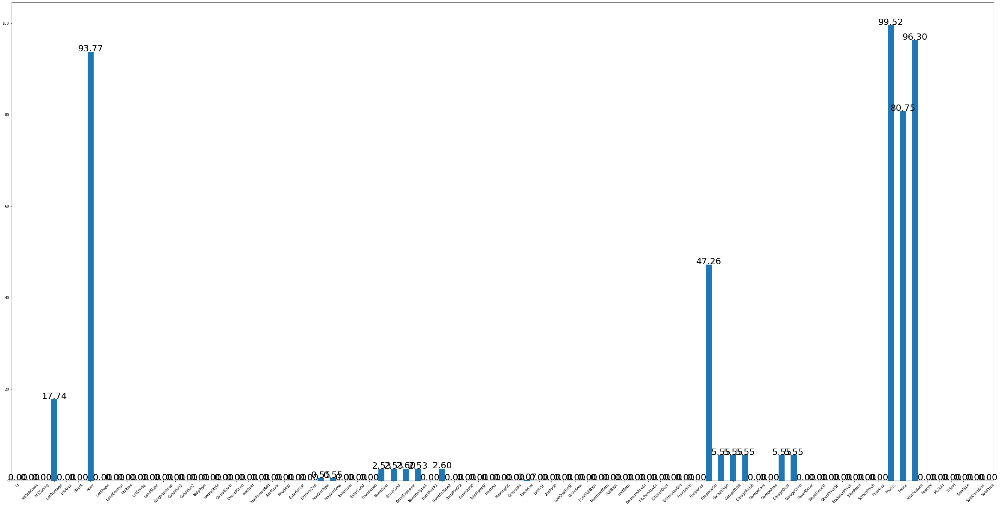

In [16]:
plt.figure(figsize=(50, 25))
plots = ((data.isnull().sum()/data.shape[0])*100).plot(kind='bar')
annot_bar_plot(plots)
plt.xticks(rotation=45)
plt.plot()

In [17]:
data.columns[data.isnull().sum()/data.shape[0] >= 0.8]

Index(['Alley', 'PoolQC', 'Fence', 'MiscFeature'], dtype='object')

<br><u>Observations</u>:
<br>There are total 5 variable, i.e., [Alley, PoolQC, Fence, MiscFeature] with null value over 80%.

So we are dropping them

In [18]:
data = data.drop(list(data.columns[data.isnull().sum()/data.shape[0] >= 0.8]), axis=1)

Now checking for other columns with null values

[]

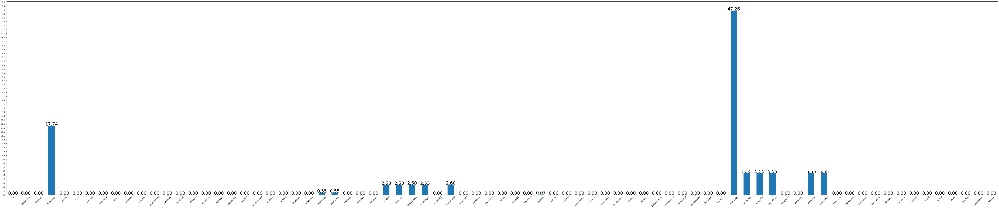

In [19]:
plt.figure(figsize=(100, 20))
plots = ((data.isnull().sum()/data.shape[0])*100).plot(kind='bar')
# plots = ((data[data.isnull().sum()/data.shape[0] > 0].isnull().sum()/data.shape[0])*100).plot(kind='bar')
annot_bar_plot(plots)
plt.xticks(rotation=45)
plt.yticks(np.linspace(0, 100, 100))
plt.plot()

In [20]:
data.columns[data.isnull().sum()/data.shape[0] > 0]

Index(['LotFrontage', 'MasVnrType', 'MasVnrArea', 'BsmtQual', 'BsmtCond',
       'BsmtExposure', 'BsmtFinType1', 'BsmtFinType2', 'Electrical',
       'FireplaceQu', 'GarageType', 'GarageYrBlt', 'GarageFinish',
       'GarageQual', 'GarageCond'],
      dtype='object')

Imputing the NULL values

Imnputing FireplaceQu as NA(from data dictionary) as its better to consider there is no fireplace than to assume quality

In [21]:
data.FireplaceQu.fillna('NA', inplace=True)

FireplaceQu: imputed with fireplace_NA value

[]

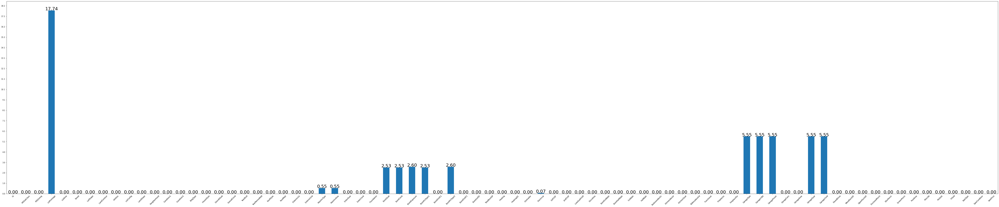

In [22]:
plt.figure(figsize=(100, 20))
plots = ((data.isnull().sum()/data.shape[0])*100).plot(kind='bar')
# plots = ((data[data.isnull().sum()/data.shape[0] > 0].isnull().sum()/data.shape[0])*100).plot(kind='bar')
annot_bar_plot(plots)
plt.xticks(rotation=45)
plt.yticks(np.linspace(0, 100, 100))
plt.plot()

In [23]:
data.columns[data.isnull().sum()/data.shape[0] > 0]

Index(['LotFrontage', 'MasVnrType', 'MasVnrArea', 'BsmtQual', 'BsmtCond',
       'BsmtExposure', 'BsmtFinType1', 'BsmtFinType2', 'Electrical',
       'GarageType', 'GarageYrBlt', 'GarageFinish', 'GarageQual',
       'GarageCond'],
      dtype='object')

Imnputing LotFrontage as mode as it is more likely to be the most occuring area size

In [24]:
data.LotFrontage.fillna(data.LotFrontage.mode()[0], inplace=True)

In [25]:
data.columns[data.isnull().sum()/data.shape[0] > 0]

Index(['MasVnrType', 'MasVnrArea', 'BsmtQual', 'BsmtCond', 'BsmtExposure',
       'BsmtFinType1', 'BsmtFinType2', 'Electrical', 'GarageType',
       'GarageYrBlt', 'GarageFinish', 'GarageQual', 'GarageCond'],
      dtype='object')

[]

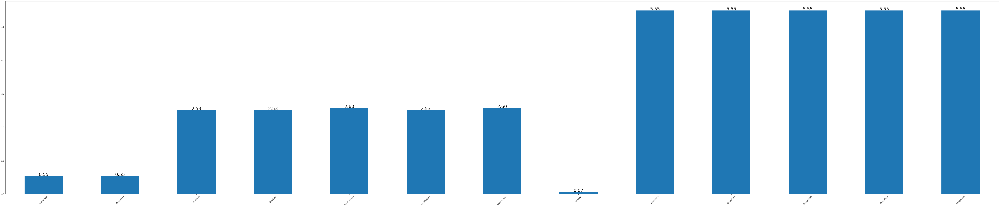

In [26]:
plt.figure(figsize=(100, 20))
plots = ((data[['MasVnrType', 'MasVnrArea', 'BsmtQual', 'BsmtCond', 'BsmtExposure',
       'BsmtFinType1', 'BsmtFinType2', 'Electrical', 'GarageType',
       'GarageYrBlt', 'GarageFinish', 'GarageQual', 'GarageCond']].isnull().sum()/data.shape[0])*100).plot(kind='bar')

annot_bar_plot(plots)
plt.xticks(rotation=45)
plt.yticks(np.linspace(0, 100, 100))
plt.plot()

In [27]:
data.GarageType.value_counts()

Attchd     870
Detchd     387
BuiltIn     88
Basment     19
CarPort      9
2Types       6
Name: GarageType, dtype: int64

In [28]:
data.GarageType.fillna('NA', inplace=True)

In [29]:
data.GarageYrBlt.value_counts()

2005.0    65
2006.0    59
2004.0    53
2003.0    50
2007.0    49
          ..
1908.0     1
1927.0     1
1933.0     1
1900.0     1
1906.0     1
Name: GarageYrBlt, Length: 97, dtype: int64

Making yearbuild as int type

In [30]:
data.YearBuilt = data.YearBuilt.astype('int64')

In [31]:
data[data['YearBuilt'] == data['GarageYrBlt']].shape[0]/data.shape[0] *100

74.58904109589041

To impute GarageYrBlt we are imputing with the build year of house as it is more likely to be build along with the house aswe can see above 74.58% of columns in both are matching

In [32]:
data.GarageYrBlt.fillna(data.YearBuilt, inplace=True)

In [33]:
data.GarageYrBlt = data.GarageYrBlt.astype('int64')

In [34]:
data.GarageFinish.value_counts()

Unf    605
RFn    422
Fin    352
Name: GarageFinish, dtype: int64

Imnputing GarageFinish as NA(from data dictionary) as its better to consider there is no GarageFinish than to assume quality

In [35]:
data.GarageFinish.fillna('NA', inplace=True)

In [36]:
data.GarageQual.value_counts()

TA    1311
Fa      48
Gd      14
Ex       3
Po       3
Name: GarageQual, dtype: int64

Imnputing GarageQual as NA(from data dictionary) as its better to consider there is no GarageQual than to assume quality

In [37]:
data.GarageQual.fillna('NA', inplace=True)

Imnputing GarageCond as NA(from data dictionary) as its better to consider there is no GarageCond than to assume quality

In [38]:
data.GarageCond.fillna('qarage_cond_NA', inplace=True)

In [39]:
data.columns[data.isnull().sum()/data.shape[0] > 0]

Index(['MasVnrType', 'MasVnrArea', 'BsmtQual', 'BsmtCond', 'BsmtExposure',
       'BsmtFinType1', 'BsmtFinType2', 'Electrical'],
      dtype='object')

[]

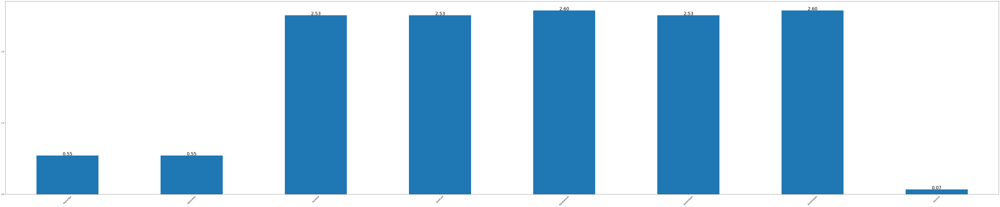

In [40]:
plt.figure(figsize=(100, 20))
plots = ((data[['MasVnrType', 'MasVnrArea', 'BsmtQual', 'BsmtCond', 'BsmtExposure',
       'BsmtFinType1', 'BsmtFinType2', 'Electrical']].isnull().sum()/data.shape[0])*100).plot(kind='bar')
# plots = ((data[data.isnull().sum()/data.shape[0] > 0].isnull().sum()/data.shape[0])*100).plot(kind='bar')
annot_bar_plot(plots)
plt.xticks(rotation=45)
plt.yticks(np.linspace(0, 100, 100))
plt.plot()

In [41]:
data['BsmtQual'].value_counts()

TA    649
Gd    618
Ex    121
Fa     35
Name: BsmtQual, dtype: int64

Imnputing BsmtQual as NA(from data dictionary) as its better to consider there is no BsmtQual than to assume quality

In [42]:
data.BsmtQual.fillna('NA', inplace=True)

In [43]:
data['BsmtCond'].value_counts()

TA    1311
Gd      65
Fa      45
Po       2
Name: BsmtCond, dtype: int64

Imnputing BsmtCond as NA(from data dictionary) as its better to consider there is no BsmtCond than to assume quality

In [44]:
data.BsmtCond.fillna('NA', inplace=True)

In [45]:
data['BsmtExposure'].value_counts()

No    953
Av    221
Gd    134
Mn    114
Name: BsmtExposure, dtype: int64

Imnputing BsmtExposure as NA(from data dictionary) as its better to consider there is no BsmtExposure than to assume quality

In [46]:
data.BsmtExposure.fillna('NA', inplace=True)

In [47]:
data['BsmtFinType1'].value_counts()

Unf    430
GLQ    418
ALQ    220
BLQ    148
Rec    133
LwQ     74
Name: BsmtFinType1, dtype: int64

Imnputing BsmtFinType1 as NA(from data dictionary) as its better to consider there is no BsmtFinType1 than to assume quality

In [48]:
data.BsmtFinType1.fillna('NA', inplace=True)

In [49]:
data['BsmtFinType2'].value_counts()

Unf    1256
Rec      54
LwQ      46
BLQ      33
ALQ      19
GLQ      14
Name: BsmtFinType2, dtype: int64

Imnputing BsmtFinType2 as NA(from data dictionary) as its better to consider there is no BsmtFinType2 than to assume quality

In [50]:
data.BsmtFinType2.fillna('NA', inplace=True)

[]

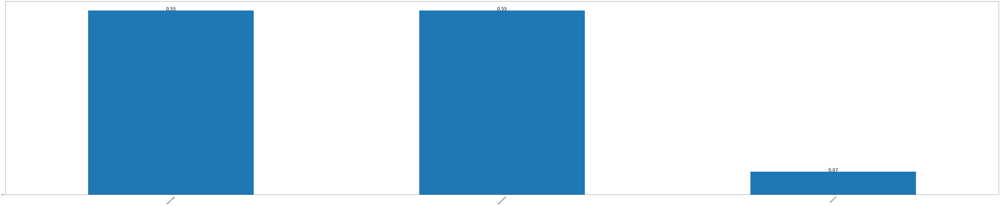

In [51]:
plt.figure(figsize=(100, 20))
plots = ((data[['MasVnrType', 'MasVnrArea', 'Electrical']].isnull().sum()/data.shape[0])*100).plot(kind='bar')

annot_bar_plot(plots)
plt.xticks(rotation=45)
plt.yticks(np.linspace(0, 100, 100))
plt.plot()

Dropping null records from this as they are only 0.55% and 0.07% only

In [52]:
data.isna().sum()[data.isna().sum()>0]

MasVnrType    8
MasVnrArea    8
Electrical    1
dtype: int64

In [53]:
#Shape of data before dropping the records
data.shape

(1460, 77)

In [54]:
data.dropna(axis=0, inplace=True)

In [55]:
#shape of data after dropping the records
data.shape

(1451, 77)

In [56]:
data.describe()

,Id,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,...,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SalePrice
count,1451.000000,1451.000000,1451.000000,1451.000000,1451.000000,1451.000000,1451.000000,1451.000000,1451.00000,1451.000000,...,1451.000000,1451.000000,1451.000000,1451.000000,1451.000000,1451.000000,1451.000000,1451.000000,1451.000000,1451.000000
mean,729.374225,56.933150,68.251551,10507.808408,6.093728,5.579600,1971.092350,1984.760165,103.75672,442.274983,...,94.412819,46.422467,21.952447,3.430737,15.154376,2.776017,43.758787,6.319090,2007.815300,180624.101999
std,421.737858,42.350366,22.371151,9992.987081,1.381467,1.113415,30.190266,20.651334,181.10815,455.369276,...,125.436852,66.060150,61.108223,29.406940,55.917522,40.301212,497.648467,2.700353,1.329376,79312.128273
min,1.000000,20.000000,21.000000,1300.000000,1.000000,1.000000,1872.000000,1950.000000,0.00000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,2006.000000,34900.000000
25%,364.500000,20.000000,60.000000,7537.500000,5.000000,5.000000,1954.000000,1966.000000,0.00000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,5.000000,2007.000000,129900.000000
50%,729.000000,50.000000,63.000000,9477.000000,6.000000,5.000000,1972.000000,1993.000000,0.00000,381.000000,...,0.000000,24.000000,0.000000,0.000000,0.000000,0.000000,0.000000,6.000000,2008.000000,162500.000000
75%,1094.500000,70.000000,79.000000,11600.000000,7.000000,6.000000,2000.000000,2004.000000,166.00000,707.000000,...,168.000000,68.000000,0.000000,0.000000,0.000000,0.000000,0.000000,8.000000,2009.000000,214000.000000
max,1460.000000,190.000000,313.000000,215245.000000,10.000000,9.000000,2010.000000,2010.000000,1600.00000,5644.000000,...,857.000000,547.000000,552.000000,508.000000,480.000000,738.000000,15500.000000,12.000000,2010.000000,755000.000000


#### Correlation plot

<AxesSubplot:>

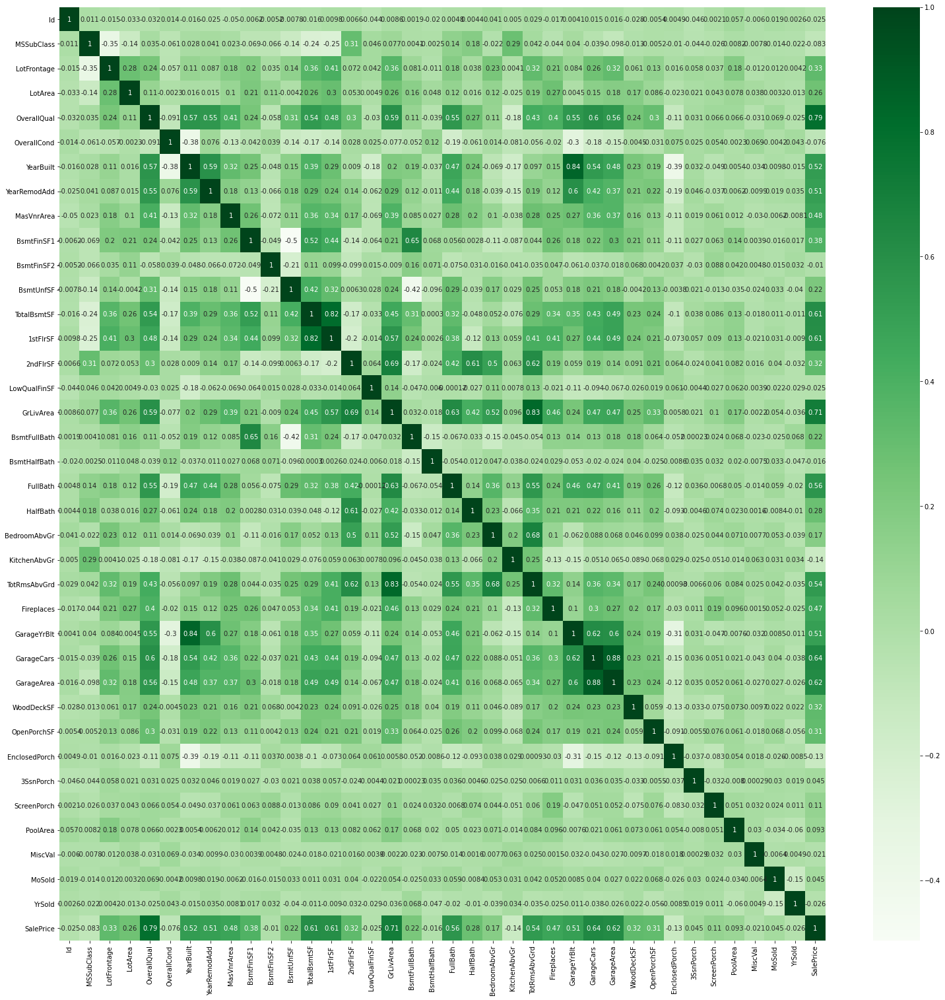

In [57]:
plt.figure(figsize=(26, 26))
sns.heatmap(data.corr(), cmap='Greens', annot=True)

#### Correlation plot with 80% correlation either direction

<AxesSubplot:>

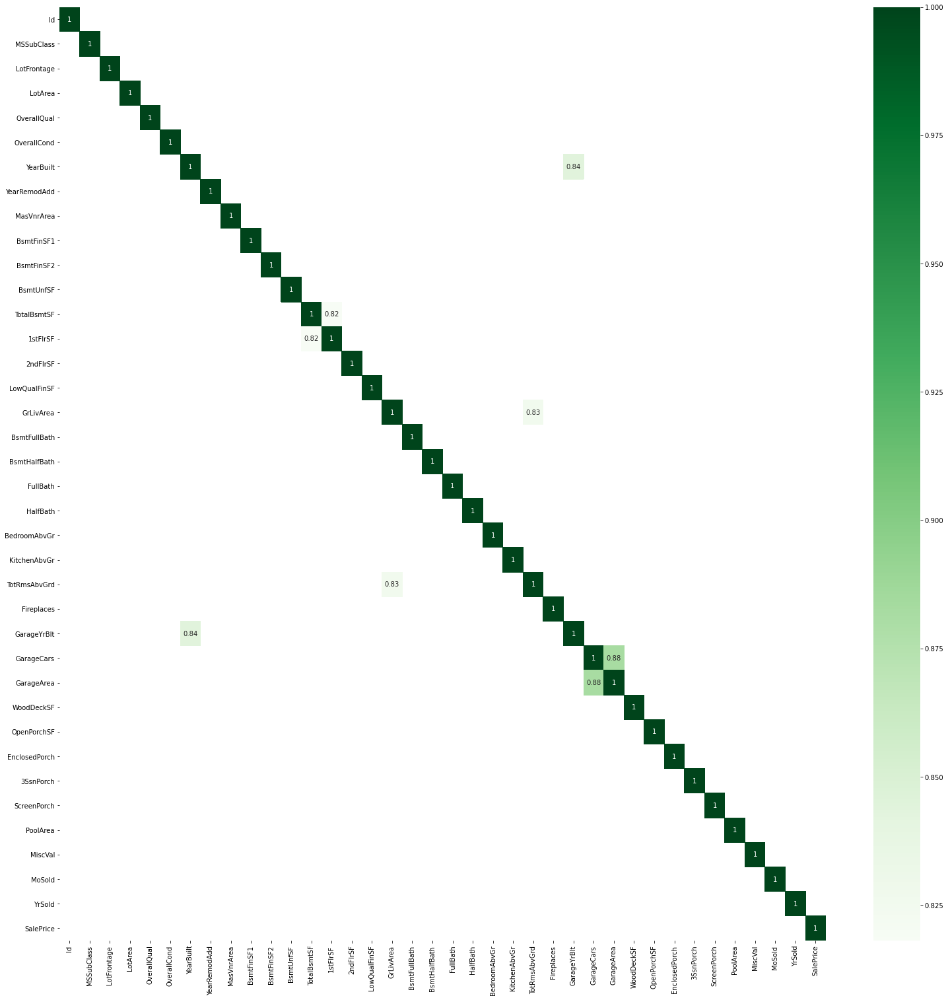

In [58]:
plt.figure(figsize=(26, 26))
sns.heatmap(data.corr()[(data.corr()>0.8) | (data.corr()<-0.8)], cmap='Greens', annot=True)

In [59]:
#getting comparition between both variables and then with the dependent 
#dropping id as it is unique variable providing no information to our model
#removing GarageYrBlt as huge correlation to YearBuilt (keeping YearBuilt)
#TotRmsAbvGrd and GrLivArea (keeping GrLivArea)
#GarageCars vs GarageArea (keeping GarageCars)
#TotalBsmtSF and 1stFlrSF dropping (keeping TotalBsmtSF)

data.drop(['Id', 'GarageYrBlt', 'TotRmsAbvGrd', 'GarageArea', '1stFlrSF'], axis=1, inplace=True)

data.shape

(1451, 72)

Looking at our response variable 'SalePrice'

<AxesSubplot:xlabel='SalePrice', ylabel='Density'>

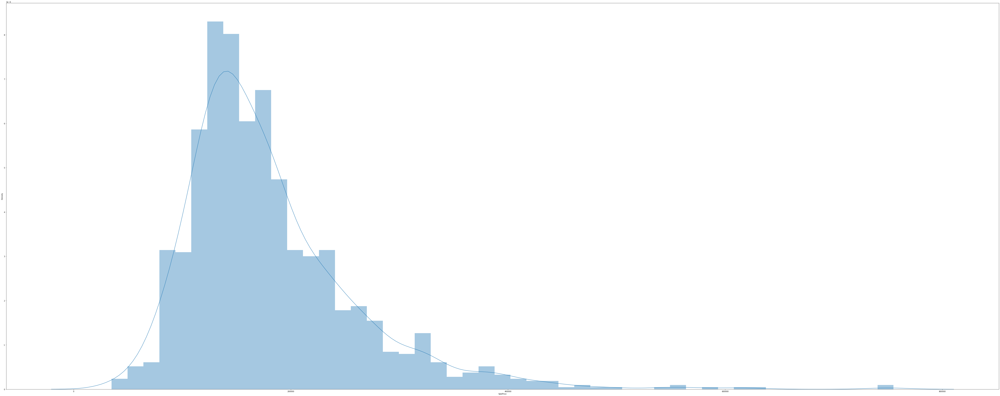

In [60]:
plt.figure(figsize=(100, 40))
sns.distplot(data.SalePrice)

Checking out unique values

Text(0.5, 1.0, 'Percentage of Unique values in the dataframe')

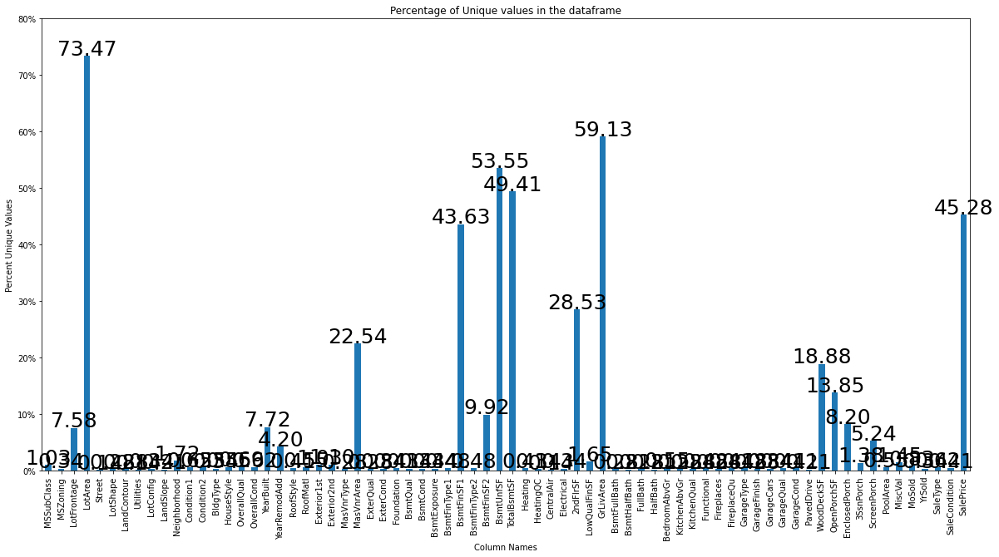

In [61]:
plt.figure(figsize=(20, 10))
plots = ((data.nunique()/data.shape[0])*100).plot(kind='bar')
plt.yticks(ticks=plt.yticks()[0], labels=[str(int(x))+'%' for x in plt.yticks()[0]])

annot_bar_plot(plots)

plt.ylabel('Percent Unique Values')
plt.xlabel('Column Names')
plt.title('Percentage of Unique values in the dataframe')

List of object type variables

In [62]:
object_type_list = []
for x, y in (get_all_types(data)).items():
    if y == object:
        object_type_list.append(x)
object_type_list

['MSZoning',
 'Street',
 'LotShape',
 'LandContour',
 'Utilities',
 'LotConfig',
 'LandSlope',
 'Neighborhood',
 'Condition1',
 'Condition2',
 'BldgType',
 'HouseStyle',
 'RoofStyle',
 'RoofMatl',
 'Exterior1st',
 'Exterior2nd',
 'MasVnrType',
 'ExterQual',
 'ExterCond',
 'Foundation',
 'BsmtQual',
 'BsmtCond',
 'BsmtExposure',
 'BsmtFinType1',
 'BsmtFinType2',
 'Heating',
 'HeatingQC',
 'CentralAir',
 'Electrical',
 'KitchenQual',
 'Functional',
 'FireplaceQu',
 'GarageType',
 'GarageFinish',
 'GarageQual',
 'GarageCond',
 'PavedDrive',
 'SaleType',
 'SaleCondition']

List of quantitative variables

In [63]:
type(data['MSSubClass'][0])

numpy.int64

In [64]:
int_type_list = []
for x, y in (get_all_types(data)).items():
    if (y == 'int64') or (y=='float64'):
        int_type_list.append(x)
int_type_list

['MSSubClass',
 'LotFrontage',
 'LotArea',
 'OverallQual',
 'OverallCond',
 'YearBuilt',
 'YearRemodAdd',
 'MasVnrArea',
 'BsmtFinSF1',
 'BsmtFinSF2',
 'BsmtUnfSF',
 'TotalBsmtSF',
 '2ndFlrSF',
 'LowQualFinSF',
 'GrLivArea',
 'BsmtFullBath',
 'BsmtHalfBath',
 'FullBath',
 'HalfBath',
 'BedroomAbvGr',
 'KitchenAbvGr',
 'Fireplaces',
 'GarageCars',
 'WoodDeckSF',
 'OpenPorchSF',
 'EnclosedPorch',
 '3SsnPorch',
 'ScreenPorch',
 'PoolArea',
 'MiscVal',
 'MoSold',
 'YrSold',
 'SalePrice']

[MSSubClass, OverallQual, OverallCond, MoSold] these variable belong to categorical type

In [65]:
for i in ['MSSubClass', 'OverallQual', 'OverallCond', 'MoSold']:
    object_type_list.append(i)
    int_type_list.remove(i)

Fixing MoSold to months values

In [66]:
data.MoSold = data.MoSold.replace([1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12], ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'])

In [67]:
data[object_type_list]

,MSZoning,Street,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,...,GarageFinish,GarageQual,GarageCond,PavedDrive,SaleType,SaleCondition,MSSubClass,OverallQual,OverallCond,MoSold
0,RL,Pave,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,...,RFn,TA,TA,Y,WD,Normal,60,7,5,Feb
1,RL,Pave,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,...,RFn,TA,TA,Y,WD,Normal,20,6,8,May
2,RL,Pave,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,...,RFn,TA,TA,Y,WD,Normal,60,7,5,Sep
3,RL,Pave,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,Norm,...,Unf,TA,TA,Y,WD,Abnorml,70,7,5,Feb
4,RL,Pave,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm,...,RFn,TA,TA,Y,WD,Normal,60,8,5,Dec
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1455,RL,Pave,Reg,Lvl,AllPub,Inside,Gtl,Gilbert,Norm,Norm,...,RFn,TA,TA,Y,WD,Normal,60,6,5,Aug
1456,RL,Pave,Reg,Lvl,AllPub,Inside,Gtl,NWAmes,Norm,Norm,...,Unf,TA,TA,Y,WD,Normal,20,6,6,Feb
1457,RL,Pave,Reg,Lvl,AllPub,Inside,Gtl,Crawfor,Norm,Norm,...,RFn,TA,TA,Y,WD,Normal,70,7,9,May
1458,RL,Pave,Reg,Lvl,AllPub,Inside,Gtl,NAmes,Norm,Norm,...,Unf,TA,TA,Y,WD,Normal,20,5,6,Apr


In [68]:
data[int_type_list]

,LotFrontage,LotArea,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,2ndFlrSF,...,GarageCars,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,YrSold,SalePrice
0,65.0,8450,2003,2003,196.0,706,0,150,856,854,...,2,0,61,0,0,0,0,0,2008,208500
1,80.0,9600,1976,1976,0.0,978,0,284,1262,0,...,2,298,0,0,0,0,0,0,2007,181500
2,68.0,11250,2001,2002,162.0,486,0,434,920,866,...,2,0,42,0,0,0,0,0,2008,223500
3,60.0,9550,1915,1970,0.0,216,0,540,756,756,...,3,0,35,272,0,0,0,0,2006,140000
4,84.0,14260,2000,2000,350.0,655,0,490,1145,1053,...,3,192,84,0,0,0,0,0,2008,250000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1455,62.0,7917,1999,2000,0.0,0,0,953,953,694,...,2,0,40,0,0,0,0,0,2007,175000
1456,85.0,13175,1978,1988,119.0,790,163,589,1542,0,...,2,349,0,0,0,0,0,0,2010,210000
1457,66.0,9042,1941,2006,0.0,275,0,877,1152,1152,...,1,0,60,0,0,0,0,2500,2010,266500
1458,68.0,9717,1950,1996,0.0,49,1029,0,1078,0,...,1,366,0,112,0,0,0,0,2010,142125


There are a total of 1451 rows
<br>29 columns in quantitative variables
<br>43 columns in categorical variables

Sanity Checks

In [69]:
data[['YearRemodAdd', 'YearBuilt']][data.YearRemodAdd < data.YearBuilt]

,YearRemodAdd,YearBuilt


In [70]:
data[['YrSold', 'YearBuilt']][data.YrSold < data.YearBuilt]

,YrSold,YearBuilt


In [71]:
data['MSSubClass'].value_counts()

20     532
60     296
50     144
120     86
30      69
160     63
70      60
80      57
90      52
190     30
85      20
75      16
45      12
180     10
40       4
Name: MSSubClass, dtype: int64

In [72]:
data['MSSubClass'].value_counts().index

Int64Index([20, 60, 50, 120, 30, 160, 70, 80, 90, 190, 85, 75, 45, 180, 40], dtype='int64')

Removing outliers

In [73]:
percent_representation(object_type_list, data)


FOR MSZoning

Count of RL is 1145 which represents about 78.911 of MSZoning
Count of RM is 218 which represents about 15.024 of MSZoning
Count of FV is 62 which represents about 4.273 of MSZoning
Count of RH is 16 which represents about 1.103 of MSZoning
Count of C (all) is 10 which represents about 0.689 of MSZoning

FOR Street

Count of Pave is 1445 which represents about 99.586 of Street
Count of Grvl is 6 which represents about 0.414 of Street

FOR LotShape

Count of Reg is 918 which represents about 63.267 of LotShape
Count of IR1 is 482 which represents about 33.218 of LotShape
Count of IR2 is 41 which represents about 2.826 of LotShape
Count of IR3 is 10 which represents about 0.689 of LotShape

FOR LandContour

Count of Lvl is 1302 which represents about 89.731 of LandContour
Count of Bnk is 63 which represents about 4.342 of LandContour
Count of HLS is 50 which represents about 3.446 of LandContour
Count of Low is 36 which represents about 2.481 of LandContour

FOR Utilities


Count of Fa is 39 which represents about 2.688 of KitchenQual

FOR Functional

Count of Typ is 1352 which represents about 93.177 of Functional
Count of Min2 is 34 which represents about 2.343 of Functional
Count of Min1 is 31 which represents about 2.136 of Functional
Count of Mod is 15 which represents about 1.034 of Functional
Count of Maj1 is 13 which represents about 0.896 of Functional
Count of Maj2 is 5 which represents about 0.345 of Functional
Count of Sev is 1 which represents about 0.069 of Functional

FOR FireplaceQu

Count of NA is 685 which represents about 47.209 of FireplaceQu
Count of Gd is 378 which represents about 26.051 of FireplaceQu
Count of TA is 311 which represents about 21.433 of FireplaceQu
Count of Fa is 33 which represents about 2.274 of FireplaceQu
Count of Ex is 24 which represents about 1.654 of FireplaceQu
Count of Po is 20 which represents about 1.378 of FireplaceQu

FOR GarageType

Count of Attchd is 863 which represents about 59.476 of GarageType
Co

We found a lot of of cat variable with more than 80% of the information explained. Removing them

In [74]:
non_usefull_cat_columns = []
for i in object_type_list:
    if any((data[i].value_counts().values/data.shape[0] * 100) >= 80):
        non_usefull_cat_columns.append(i)
data.drop(non_usefull_cat_columns, axis=1, inplace=True)
data.shape

(1451, 52)

In [75]:
for i in non_usefull_cat_columns:
    object_type_list.remove(i)

In [76]:
len(object_type_list)

23

After Removing non useful variable we are left with 23 categorical variables

In [77]:
#converting into year age
data.YearRemodAdd = data.YearBuilt.max() - data.YearRemodAdd
data.YrSold = data.YearBuilt.max() - data.YrSold
data.YearBuilt = data.YearBuilt.max() - data.YearBuilt

Plotting and checking distribution of these age variables

<AxesSubplot:>

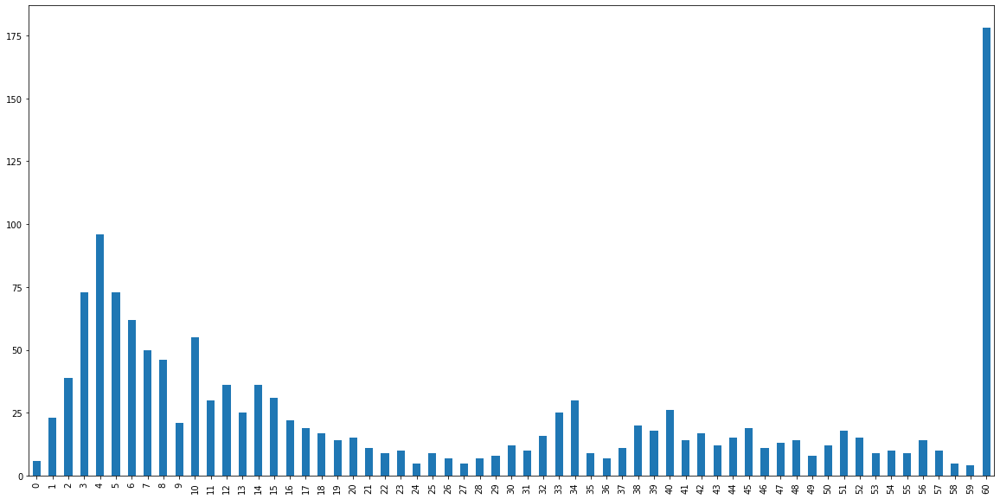

In [78]:
plt.figure(figsize=(20, 10))
data.YearRemodAdd.value_counts(sort=False).plot(kind='bar')

<AxesSubplot:>

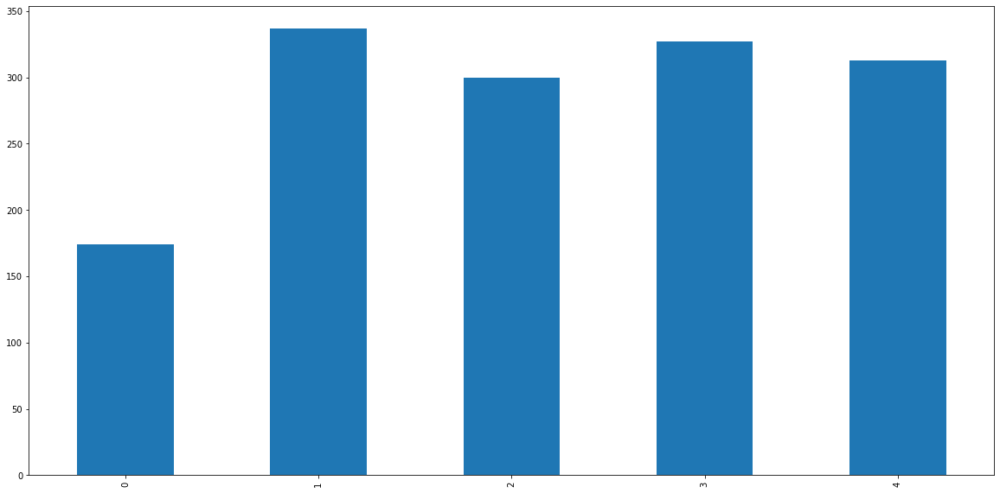

In [79]:
plt.figure(figsize=(20, 10))
data.YrSold.value_counts(sort=False).plot(kind='bar')

<AxesSubplot:>

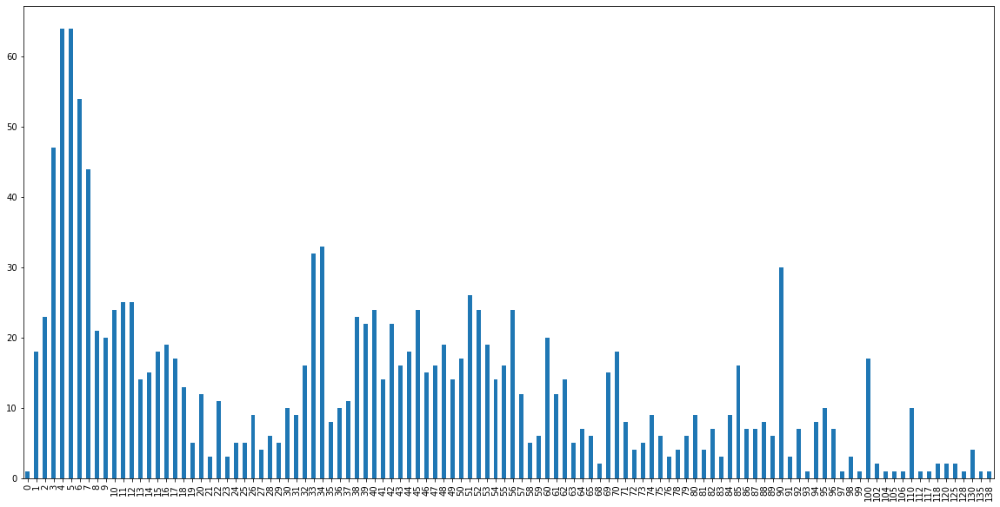

In [80]:
plt.figure(figsize=(20, 10))
data.YearBuilt.value_counts(sort=False).plot(kind='bar')

Plotting all numerical variables

In [81]:
continous_vars = ['LotFrontage','LotArea', 'MasVnrArea','BsmtFinSF1','BsmtUnfSF', 'TotalBsmtSF',
                  '2ndFlrSF','GrLivArea','WoodDeckSF', 'SalePrice']

to_bin = ['MiscVal', 'BsmtFinSF2', 'LowQualFinSF', 'OpenPorchSF', 'EnclosedPorch', '3SsnPorch', 'ScreenPorch', 'PoolArea']

discrete_vars = list(set(int_type_list).difference(set(continous_vars).union(set(to_bin))))

In [82]:
print('Continuus:', continous_vars)
print('To Bin:', to_bin)
print('Discrete:', discrete_vars)

Continuus: ['LotFrontage', 'LotArea', 'MasVnrArea', 'BsmtFinSF1', 'BsmtUnfSF', 'TotalBsmtSF', '2ndFlrSF', 'GrLivArea', 'WoodDeckSF', 'SalePrice']
To Bin: ['MiscVal', 'BsmtFinSF2', 'LowQualFinSF', 'OpenPorchSF', 'EnclosedPorch', '3SsnPorch', 'ScreenPorch', 'PoolArea']
Discrete: ['BedroomAbvGr', 'FullBath', 'HalfBath', 'BsmtHalfBath', 'YearRemodAdd', 'YrSold', 'Fireplaces', 'KitchenAbvGr', 'YearBuilt', 'GarageCars', 'BsmtFullBath']


In [83]:
for i in to_bin:
    print(i)
    print(round(data[i].value_counts()[0]/data.shape[0] * 100, 2))

MiscVal
96.42
BsmtFinSF2
88.49
LowQualFinSF
98.21
OpenPorchSF
45.0
EnclosedPorch
85.73
3SsnPorch
98.35
ScreenPorch
92.01
PoolArea
99.52


In [84]:
# dropping variable with 0 values above 80%
# i.e ['MiscVal', 'BsmtFinSF2', 'LowQualFinSF', '3SsnPorch', 'ScreenPorch', 'PoolArea']
data.shape
data.drop(['MiscVal', 'BsmtFinSF2', 'LowQualFinSF', '3SsnPorch', 'ScreenPorch', 'EnclosedPorch', 'PoolArea'], axis=1, inplace=True)
data.shape

(1451, 45)

In [85]:
for i in ['MiscVal', 'BsmtFinSF2', 'LowQualFinSF', '3SsnPorch', 'ScreenPorch', 'EnclosedPorch', 'PoolArea']:
    to_bin.remove(i)
    int_type_list.remove(i)

In [86]:
continous_vars.append('OpenPorchSF')

Dropping Outliers

In [87]:
for i in continous_vars:
    Q1,Q3 = np.percentile(data[i] , [25,75])
    IQR = abs(Q3-Q1)

    i_abv_range = Q3+(1.5*IQR)
    print(i, i_abv_range)
    
    print("Shape before removing the records: {}".format(data.shape))
    data = data[data[i]<i_abv_range]
    print("Shape after removing the records: {}".format(data.shape))
#     data[i].plot(kind='box', vert=False)

LotFrontage 107.5
Shape before removing the records: (1451, 45)
Shape after removing the records: (1393, 45)
LotArea 17133.0
Shape before removing the records: (1393, 45)
Shape after removing the records: (1335, 45)
MasVnrArea 406.25
Shape before removing the records: (1335, 45)
Shape after removing the records: (1250, 45)
BsmtFinSF1 1696.875
Shape before removing the records: (1250, 45)
Shape after removing the records: (1249, 45)
BsmtUnfSF 1657.0
Shape before removing the records: (1249, 45)
Shape after removing the records: (1228, 45)
TotalBsmtSF 1838.875
Shape before removing the records: (1228, 45)
Shape after removing the records: (1212, 45)
2ndFlrSF 1790.0
Shape before removing the records: (1212, 45)
Shape after removing the records: (1212, 45)
GrLivArea 2593.25
Shape before removing the records: (1212, 45)
Shape after removing the records: (1187, 45)
WoodDeckSF 390.0
Shape before removing the records: (1187, 45)
Shape after removing the records: (1163, 45)
SalePrice 290000.0
S

### UVA 

Categorical Variables

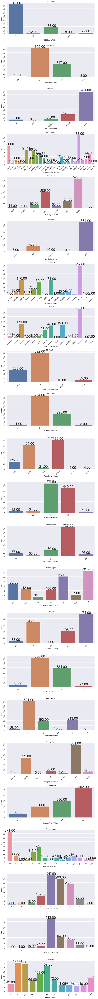

In [88]:
plot_categorical(object_type_list, data)

Variable: <b>MSZoning Values</b>
<br><u>Observations</u>:
<br>The most data is available for RL and the least for C(all) 
<br><u>Analysis</u>:
<br>RL as is low density residentials may have most demands as well as most interactions.
<br>Commertial building are rare to be delt on and thus could explain the scarecity of data.
<br>
Variable: <b>houseStyle Values</b>
<br><u>Observations</u>:
<br>The most data is available for 1Story buildings
<br><u>Analysis</u>:
<br>It seems to be attracting more customers maybe due to less maintenance and small size of families, also may cost lesser.
<br>
Variable: <b>ExterQual Values</b>
<br><u>Observations</u>:
<br>The most data is available for TA(average/Typical) and the least for Ex(excellent) quality.
<br><u>Analysis</u>:
<br>TA seems to be the least quality a person would try to acquire for a decent price, on the other hand excellent would be costing more so not a lot of buyers
<br>

<br><u>Observations</u>:
<br>The most data is available for TA(average/Typical) and the least for Ex(excellent) quality for most of the records.
<br><u>Analysis</u>:
<br>TA seems to be the least quality a person would try to acquire for a decent price, on the other hand excellent would be costing more so not a lot of buyers
<br>

<br><u>Observations</u>:
<br>Mostly the overall quality seems to max out at average values
<br><u>Analysis</u>:
<br>Average quality seems to be the least quality a person would try to acquire for a decent price, on the other hand excellent and below average qualities would be costing more so not a lot of buyers
<br>

Quantitative variable

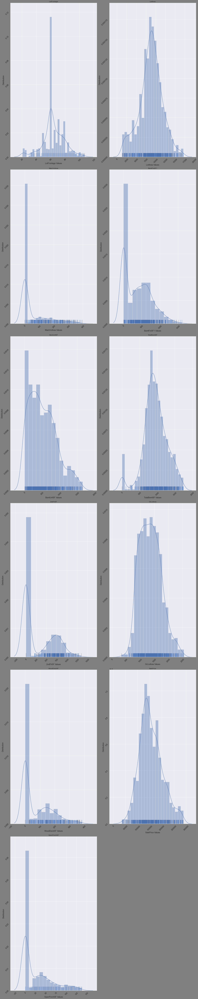

In [89]:
plot_quantitative(continous_vars, data)

Variable: <b>LotFrontage</b>
<br><u>Observations</u>:
<br>The pattern seems to be following a normal around 60, which is the highest value.
<br><u>Analysis</u>:
<br>This might be a big enough space for living in comfort without spending a fortune.
<br>
Variable: <b>Basement Variables</b>
<br><u>Observations</u>:
<br>It seems people prefer no basements.
<br><u>Analysis</u>:
<br>This can be due to the fact that basements usually add up on value and requires extra maintenance.
<br>
Variable: <b>2nd floorSF</b>
<br><u>Observations</u>:
<br>It seems people prefer homes with single story more than multiple.
<br><u>Analysis</u>:
<br>This can be due to the fact that extra stories usually add up on value and requires extra maintenance.
Variable: <b>OpenPorchSF</b>
<br><u>Observations</u>:
<br>It seems people prefer no open porch.
<br>If they want they are most inclined for a smaller size of around 30-40
<br><u>Analysis</u>:
<br>This can be due to the fact that porch usually add up on value and requires extra maintenance.
<br>

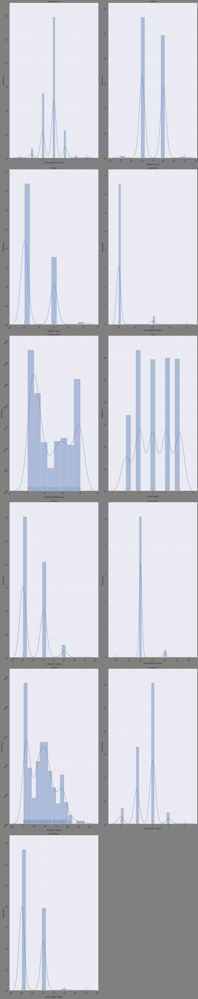

In [90]:
#discrete numerical variable
plot_quantitative(discrete_vars, data)

Variable: <b>GarageCars</b>
<br><u>Observations</u>:
<br>Most people are looking to store 2 cars
<br><u>Analysis</u>:
<br>Now a days houses usually have at least 2 cars, one of both the partners min.
<br>
Variable: <b>year of build</b>
<br><u>Observations</u>:
<br>Most houses are build in the past 30-50 years
<br><u>Analysis</u>:
<br>New houses have better reliability, structure and reliability
<br>
Variable: <b>fireplace</b>
<br><u>Observations</u>:
<br>People seem to prefer single fireplace setiing.
<br><u>Analysis</u>:
<br>More than one fireplace is usually not needed in a house
<br>As we saw above people usually prefer smaller places so a single fireplace makes sense

<AxesSubplot:>

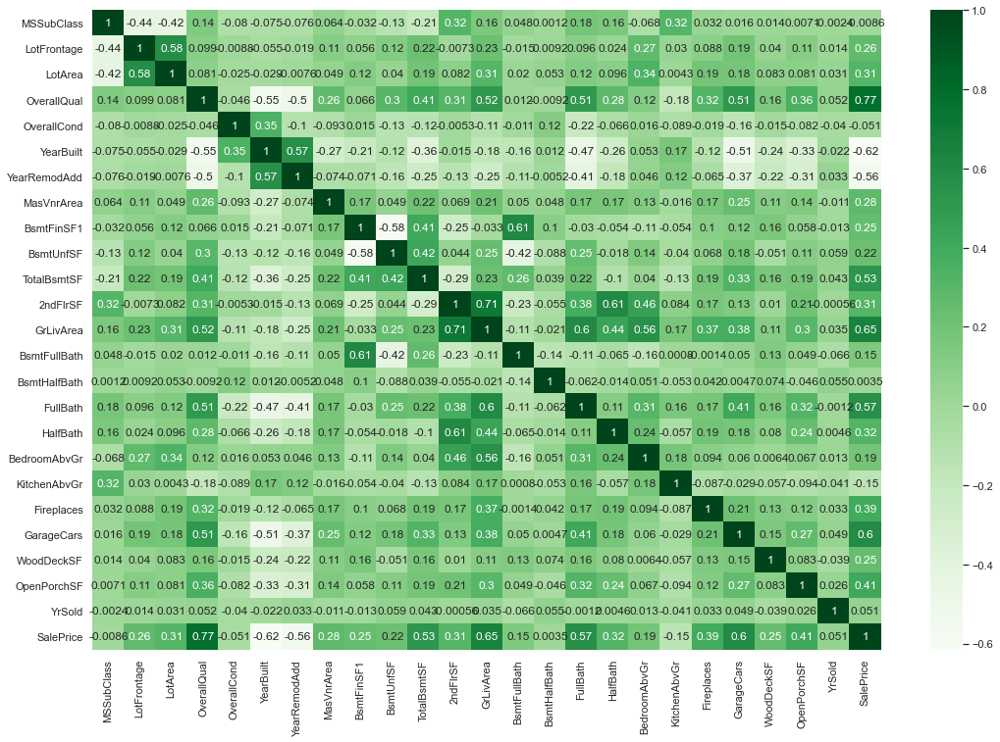

In [91]:
plt.figure(figsize=(18, 12))
sns.heatmap(data.corr(), cmap='Greens', annot=True)

BVA

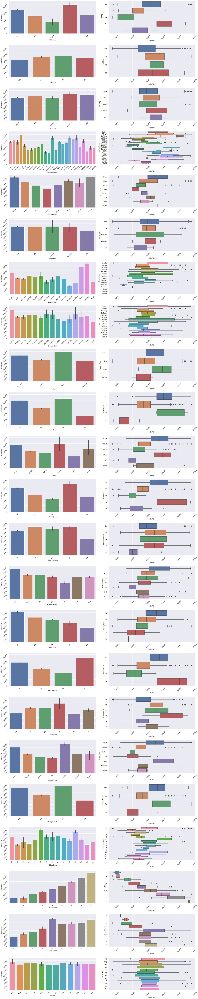

In [92]:
plot_quan_cat(object_type_list, data)

Variable: <b>MSZoning</b>
<br><u>Observations</u>:
<br>Highest price are for floating villages
<br><u>Analysis</u>:
<br>Floating Villages are modern setups and have high demand and low supply thus causing the higher price.
<br>
<br><u>Observations</u>:
<br>LotShpae and LotConfig have not a lot of impact on prices
<br>
<br><u>Observations</u>:
<br>Quality is usually a factor for higher prices, i.e., Ex usually indulges highest of the costs and poor and fair are on the lower spectrum
<br><u>Analysis</u>:
<br>Better the quality the price tends to increase in all areas.
<br>
<br><u>Observations</u>:
<br>OveralQuality and condition increase cause a steady increase in SalePrice
<br><u>Analysis</u>:
<br>Better the quality the price tends to increase in all areas.
<br>
<br><u>Observations</u>:
<br>Months are looking as of not affecting the sales prices.
<br><u>Analysis</u>:
<br>People are looking to buying properties throughout the year and thus not a fluctuations

In [93]:
quantitative_vars = list(set(continous_vars).union(set(discrete_vars).union(set(to_bin))))

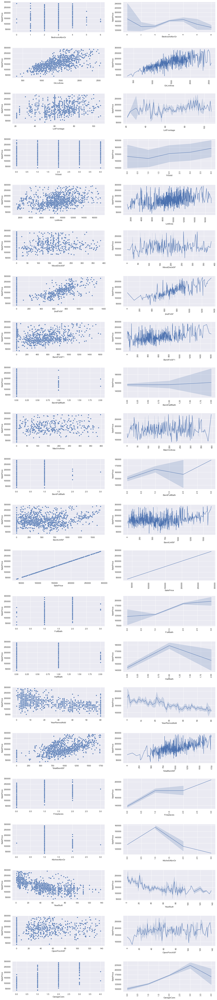

In [94]:
plot_quan_quan(quantitative_vars, data)

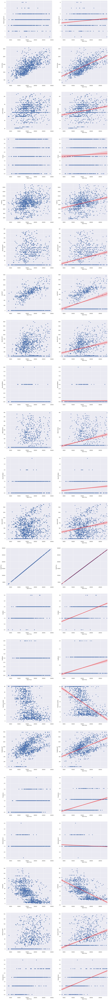

In [95]:
getScatter(quantitative_vars, data)

Pair Plot

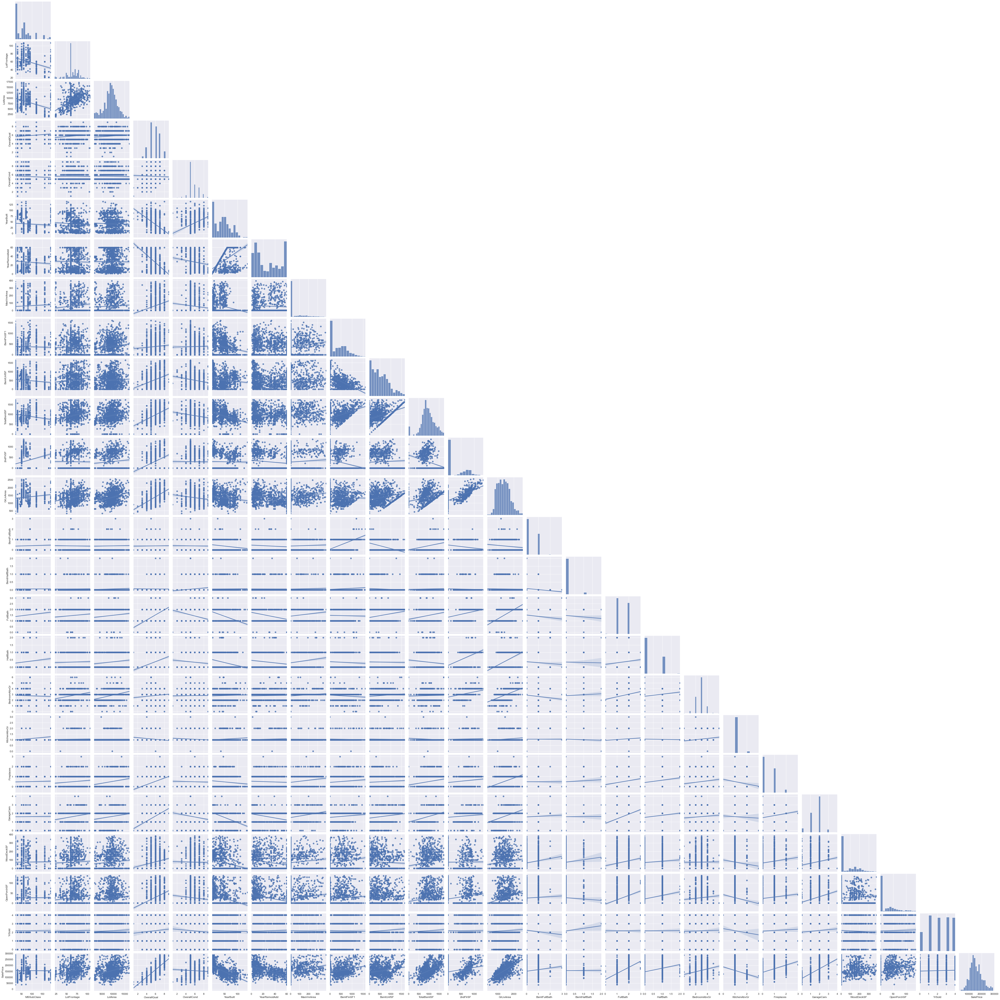

In [96]:
sns.pairplot(data, kind='reg', corner=True)

The Above plots help us realise the first assumption of linear regression, i.e. linearity beween predictor and resonce variables

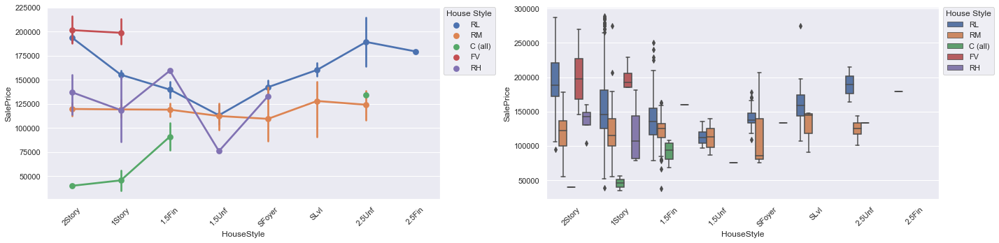

In [97]:
# dti, purpose
x = 'HouseStyle'
y = 'SalePrice'
hue = 'MSZoning'

plt.figure(figsize=(20, 5))
plt.subplot(1, 2, 1)
sns.pointplot(x=x, y=y, hue=hue, data=data)
plt.xticks(rotation=45)
plt.legend(title='House Style', bbox_to_anchor=(1, 1.02), loc='upper left')
plt.xlabel(x)
plt.ylabel(y)

plt.subplot(1, 2, 2)
sns.boxplot(x=x, y=y, hue=hue, data=data)
plt.xticks(rotation=45)
plt.legend(title='House Style', bbox_to_anchor=(1, 1.02), loc='upper left')
plt.xlabel(x)
plt.ylabel(y)

plt.tight_layout()

Finally After EDA

In [98]:
data.shape

(1045, 45)

In [99]:
data.columns

Index(['MSSubClass', 'MSZoning', 'LotFrontage', 'LotArea', 'LotShape',
       'LotConfig', 'Neighborhood', 'HouseStyle', 'OverallQual', 'OverallCond',
       'YearBuilt', 'YearRemodAdd', 'RoofStyle', 'Exterior1st', 'Exterior2nd',
       'MasVnrType', 'MasVnrArea', 'ExterQual', 'Foundation', 'BsmtQual',
       'BsmtExposure', 'BsmtFinType1', 'BsmtFinSF1', 'BsmtUnfSF',
       'TotalBsmtSF', 'HeatingQC', '2ndFlrSF', 'GrLivArea', 'BsmtFullBath',
       'BsmtHalfBath', 'FullBath', 'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr',
       'KitchenQual', 'Fireplaces', 'FireplaceQu', 'GarageType',
       'GarageFinish', 'GarageCars', 'WoodDeckSF', 'OpenPorchSF', 'MoSold',
       'YrSold', 'SalePrice'],
      dtype='object')

## Model Building

# Data Prep

In [100]:
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import Ridge, Lasso
from sklearn.metrics import r2_score, mean_squared_error

from sklearn.preprocessing import MinMaxScaler, StandardScaler

from sklearn.preprocessing import LabelEncoder, LabelBinarizer, OrdinalEncoder

from sklearn.model_selection import GridSearchCV
import statsmodels.api as sm

from sklearn.feature_selection import RFE

In [101]:
object_type_list

['MSZoning',
 'LotShape',
 'LotConfig',
 'Neighborhood',
 'HouseStyle',
 'RoofStyle',
 'Exterior1st',
 'Exterior2nd',
 'MasVnrType',
 'ExterQual',
 'Foundation',
 'BsmtQual',
 'BsmtExposure',
 'BsmtFinType1',
 'HeatingQC',
 'KitchenQual',
 'FireplaceQu',
 'GarageType',
 'GarageFinish',
 'MSSubClass',
 'OverallQual',
 'OverallCond',
 'MoSold']

Checking how the categorical variables look

In [102]:
for i in object_type_list:
    print(i+':')
    for j in list(data[i].unique()):
        print('  ' + str(j))

MSZoning:
  RL
  RM
  C (all)
  FV
  RH
LotShape:
  Reg
  IR1
  IR2
  IR3
LotConfig:
  Inside
  FR2
  Corner
  CulDSac
  FR3
Neighborhood:
  CollgCr
  Veenker
  Crawfor
  NoRidge
  Mitchel
  OldTown
  BrkSide
  Sawyer
  NAmes
  SawyerW
  IDOTRR
  MeadowV
  NridgHt
  Edwards
  Gilbert
  ClearCr
  NWAmes
  Timber
  Somerst
  StoneBr
  NPkVill
  Blmngtn
  BrDale
  SWISU
  Blueste
HouseStyle:
  2Story
  1Story
  1.5Fin
  1.5Unf
  SFoyer
  SLvl
  2.5Unf
  2.5Fin
RoofStyle:
  Gable
  Hip
  Gambrel
  Mansard
  Flat
Exterior1st:
  VinylSd
  MetalSd
  Wd Sdng
  BrkFace
  HdBoard
  CemntBd
  AsbShng
  Stucco
  Plywood
  WdShing
  BrkComm
  AsphShn
  Stone
  ImStucc
  CBlock
Exterior2nd:
  VinylSd
  MetalSd
  Wd Shng
  HdBoard
  Plywood
  Wd Sdng
  CmentBd
  BrkFace
  Stucco
  AsbShng
  Brk Cmn
  ImStucc
  AsphShn
  Stone
  CBlock
MasVnrType:
  BrkFace
  None
  Stone
  BrkCmn
ExterQual:
  Gd
  TA
  Ex
  Fa
Foundation:
  PConc
  CBlock
  BrkTil
  Wood
  Slab
  Stone
BsmtQual:
  Gd
  TA
  NA
  Ex
 

### Ordinal features

['ExterQual', 'BsmtQual', 'BsmtExposure', 'HeatingQC', 'KitchenQual', 'GarageFinish', 'FireplaceQu','OverallQual','OverallCond']

Converting ordinal categorical features to orders

In [103]:
data['ExterQual'] = data['ExterQual'].map({'Ex': 4, 'Gd': 3, 'TA': 2, 'Fa': 1, 'Po': 0})
data['BsmtQual'] = data['BsmtQual'].map({'Ex': 5, 'Gd': 4, 'TA': 3, 'Fa': 2, 'Po': 1, 'NA': 0})
data['BsmtExposure'] = data['BsmtExposure'].map({'Gd': 4, 'Av': 3, 'Mn': 2, 'No': 1, 'NA': 0})
data['HeatingQC'] = data['HeatingQC'].map({'Ex': 4, 'Gd': 3, 'TA': 2, 'Fa': 1, 'Po': 0})
data['KitchenQual'] = data['KitchenQual'].map({'Ex': 4, 'Gd': 3, 'TA': 2, 'Fa': 1, 'Po': 0})
data['GarageFinish'] = data['GarageFinish'].map({'Fin': 3, 'RFn': 2, 'Unf': 1, 'NA': 0})
data['FireplaceQu'] = data['FireplaceQu'].map({'Ex': 5, 'Gd': 4, 'TA': 3, 'Fa': 2, 'Po': 1, 'NA': 0})

### Nominal categorical features

Replacing MSSubClass with values

In [104]:
data['MSSubClass'] = data['MSSubClass'].map({20:'1-STORY 1946 & NEWER ALL STYLES',
        30:'1-STORY 1945 & OLDER',
        40:'1-STORY W/FINISHED ATTIC ALL AGES',
        45:'1-1/2 STORY - UNFINISHED ALL AGES',
        50:'1-1/2 STORY FINISHED ALL AGES',
        60:'2-STORY 1946 & NEWER',
        70:'2-STORY 1945 & OLDER',
        75:'2-1/2 STORY ALL AGES',
        80:'SPLIT OR MULTI-LEVEL',
        85:'SPLIT FOYER',
        90:'DUPLEX - ALL STYLES AND AGES',
       120:'1-STORY PUD (Planned Unit Development) - 1946 & NEWER',
       150:'1-1/2 STORY PUD - ALL AGES',
       160:'2-STORY PUD - 1946 & NEWER',
       180:'PUD - MULTILEVEL - INCL SPLIT LEV/FOYER',
       190:'2 FAMILY CONVERSION - ALL STYLES AND AGES'})

In [105]:
list(set(object_type_list).difference(set(['ExterQual', 'BsmtQual', 'BsmtExposure', 'HeatingQC', 'KitchenQual', 'GarageFinish', 'OverallQual','OverallCond', 'FireplaceQu'])))

['Neighborhood',
 'HouseStyle',
 'Foundation',
 'Exterior2nd',
 'GarageType',
 'RoofStyle',
 'MasVnrType',
 'MoSold',
 'BsmtFinType1',
 'Exterior1st',
 'LotConfig',
 'LotShape',
 'MSZoning',
 'MSSubClass']

Dummy Variables

In [106]:
print(data.shape)
for i in list(set(object_type_list).difference(set(['ExterQual', 'BsmtQual', 'BsmtExposure', 'HeatingQC', 'KitchenQual', 'GarageFinish', 'OverallQual','OverallCond', 'FireplaceQu']))):
    data = make_dummy(data, i, pref=i)
data.shape

(1045, 45)
(1045, 68)
(1045, 74)
(1045, 78)
(1045, 91)
(1045, 96)
(1045, 99)
(1045, 101)
(1045, 111)
(1045, 116)
(1045, 129)
(1045, 132)
(1045, 134)
(1045, 137)
(1045, 150)


(1045, 150)

After Dummy Variables we are left with
<br>1045 rows
<br>150 columns

### Train Test Split

In [107]:
data_train, data_test = train_test_split(data, train_size=0.7, random_state=100)

In [108]:
print(data_train.shape)
print(data_test.shape)

(731, 150)
(314, 150)


### Model 

## Scaling

In [109]:
len(quantitative_vars)

22

In [110]:
quantitative_vars

['BedroomAbvGr',
 'GrLivArea',
 'LotFrontage',
 'YrSold',
 'LotArea',
 'WoodDeckSF',
 '2ndFlrSF',
 'BsmtFinSF1',
 'BsmtHalfBath',
 'MasVnrArea',
 'BsmtFullBath',
 'BsmtUnfSF',
 'SalePrice',
 'FullBath',
 'HalfBath',
 'YearRemodAdd',
 'TotalBsmtSF',
 'Fireplaces',
 'KitchenAbvGr',
 'YearBuilt',
 'OpenPorchSF',
 'GarageCars']

Using standard scaling

In [111]:
std_scaler = StandardScaler()
data_train[quantitative_vars] = std_scaler.fit_transform(data_train[quantitative_vars])
data_train[quantitative_vars].describe()

,BedroomAbvGr,GrLivArea,LotFrontage,YrSold,LotArea,WoodDeckSF,2ndFlrSF,BsmtFinSF1,BsmtHalfBath,MasVnrArea,...,SalePrice,FullBath,HalfBath,YearRemodAdd,TotalBsmtSF,Fireplaces,KitchenAbvGr,YearBuilt,OpenPorchSF,GarageCars
count,7.310000e+02,7.310000e+02,7.310000e+02,7.310000e+02,7.310000e+02,7.310000e+02,7.310000e+02,7.310000e+02,7.310000e+02,7.310000e+02,...,7.310000e+02,7.310000e+02,7.310000e+02,7.310000e+02,7.310000e+02,7.310000e+02,7.310000e+02,7.310000e+02,7.310000e+02,7.310000e+02
mean,3.341300e-17,-3.781745e-17,3.839458e-16,2.294866e-16,1.995668e-16,1.520292e-16,-2.080719e-16,3.888059e-17,1.409421e-16,2.281197e-16,...,3.085197e-16,7.198984e-17,-4.161438e-17,4.275346e-17,3.128672e-17,-1.260582e-17,-8.497535e-17,-1.306145e-17,4.586694e-17,1.227169e-16
std,1.000685e+00,1.000685e+00,1.000685e+00,1.000685e+00,1.000685e+00,1.000685e+00,1.000685e+00,1.000685e+00,1.000685e+00,1.000685e+00,...,1.000685e+00,1.000685e+00,1.000685e+00,1.000685e+00,1.000685e+00,1.000685e+00,1.000685e+00,1.000685e+00,1.000685e+00,1.000685e+00
min,-3.763211e+00,-2.665771e+00,-2.797738e+00,-1.619836e+00,-2.557774e+00,-7.632327e-01,-7.520383e-01,-1.055065e+00,-2.540145e-01,-5.968419e-01,...,-2.534570e+00,-2.813997e+00,-6.985646e-01,-1.363444e+00,-2.819199e+00,-8.291855e-01,-4.661829e+00,-1.422565e+00,-7.464078e-01,-2.392317e+00
25%,-1.067565e+00,-7.845339e-01,-2.754208e-01,-8.661119e-01,-5.510175e-01,-7.632327e-01,-7.520383e-01,-1.055065e+00,-2.540145e-01,-5.968419e-01,...,-6.487907e-01,-8.915374e-01,-6.985646e-01,-9.797744e-01,-5.334901e-01,-8.291855e-01,-2.245933e-01,-9.754756e-01,-7.464078e-01,-9.140551e-01
50%,2.802587e-01,-5.698340e-02,-2.754208e-01,-1.123883e-01,2.686036e-02,-7.632327e-01,-7.520383e-01,-1.262322e-01,-2.540145e-01,-5.968419e-01,...,-1.730589e-01,-8.915374e-01,-6.985646e-01,-1.165180e-01,-4.539597e-02,-8.291855e-01,-2.245933e-01,-4.690601e-02,-7.464078e-01,5.642066e-01
75%,2.802587e-01,7.069446e-01,6.623636e-01,6.413353e-01,5.998064e-01,7.338776e-01,1.018657e+00,6.878465e-01,-2.540145e-01,4.088299e-01,...,5.902264e-01,1.030922e+00,1.319818e+00,9.145939e-01,5.929955e-01,8.452194e-01,-2.245933e-01,6.065318e-01,5.632865e-01,5.642066e-01
max,4.323729e+00,3.029909e+00,2.764294e+00,1.395059e+00,2.823055e+00,3.136457e+00,2.813137e+00,3.281288e+00,7.482843e+00,3.365805e+00,...,2.829338e+00,2.953382e+00,3.338200e+00,1.514077e+00,2.365313e+00,4.194029e+00,4.212642e+00,3.289066e+00,3.018963e+00,3.520730e+00


Dividing in X_train and y_train

In [112]:
y_train = data_train.pop('SalePrice')
X_train = data_train

Scaling Test data and spliting in X_test and y_test

In [113]:
data_test[quantitative_vars] = std_scaler.transform(data_test[quantitative_vars])
y_test = data_test.pop('SalePrice')
X_test = data_test

## Linear Model

In [114]:
lm = LinearRegression()
lm.fit(X_train, y_train)

LinearRegression()

In [115]:
print(lm.intercept_)
print(lm.coef_)

-3.2129817989627227
[ 1.84859749e-02  8.89484155e-02  1.16291175e-01  1.01852726e-01
 -1.64135554e-01 -2.38099532e-02  8.49578419e-03 -2.35029552e-02
  2.06521904e-02  5.30157051e-02  4.10741992e-02 -3.98843130e-02
  1.71673995e-01  5.34441323e-03  3.04688097e-02  3.63043704e-01
  4.68139518e-02  1.59514903e-02  3.25885360e-02  4.64436138e-02
 -4.47441053e-02 -3.68924029e-02  1.00432482e-01  2.86953702e-02
  1.22171845e-04  3.77986058e-02  9.16465563e-02  5.25608520e-03
  1.06949778e-02  2.41433482e-03  1.85480560e-01  2.45486354e-01
  3.01376067e-01 -7.96136110e-02  5.53438563e-03  5.58632504e-01
 -1.30537411e-01 -1.92060123e-01  2.27680622e-01 -2.27344183e-01
 -4.88939671e-02 -2.47698280e-02  4.39446247e-02 -2.04939155e-01
  1.46383712e-01  3.34853793e-01  2.80110718e-02  1.08122552e-01
 -5.92958425e-02 -2.66759869e-02  3.61208062e-01  3.73014112e-01
  1.34121090e-01  3.28971127e-01  2.03817369e-02  1.93131307e-01
  5.75092543e+12 -6.91041957e-02 -1.61189600e-02  1.80975236e-01
  3.3

In [116]:
metric_lm = getOutputs(lm, X_train, X_test, y_train, y_test)

0.9269717306755896
-1.0665787840153853e+23
53.38366487614398
3.3073146845138832e+25
0.07302826932441037
1.0532849313738481e+23


### Assumption 1: Linearity
   - As we have seen above Linearity of dependent and indepent error satisfies

### Assumption 2: Normality of Error

Mean of residual: -2.0350246564314977e-07
Std Deviation of residual: 0.2702374313901924


Text(0.5, 0, 'residual values')

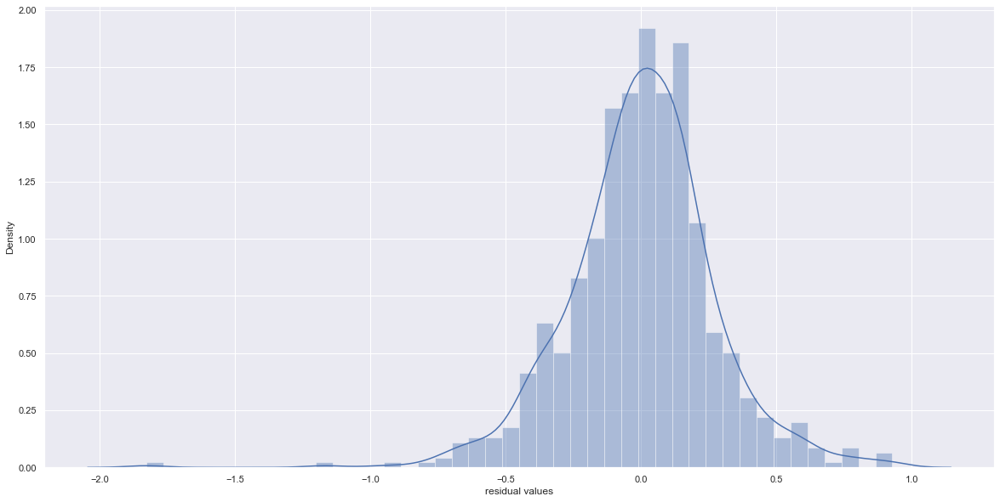

In [117]:
y_train_pred_lm = lm.predict(X_train)
res_lm = y_train-y_train_pred_lm
print("Mean of residual: {}".format(np.mean(y_train-y_train_pred_lm)))
print("Std Deviation of residual: {}".format(np.std(res_lm)))

plt.figure(figsize=(20, 10))
sns.distplot(res_lm)
plt.xlabel('residual values')

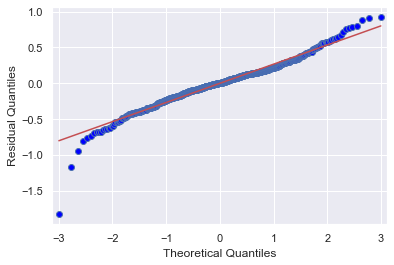

<Figure size 1440x720 with 0 Axes>

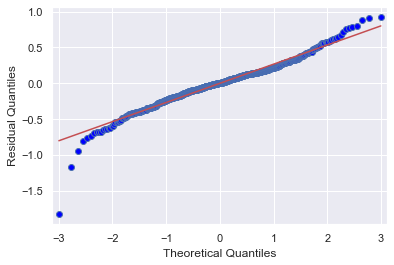

In [118]:
plt.figure(figsize=(20, 10))
sm.qqplot(res_lm, ylabel = "Residual Quantiles", line="r")

qqplot roughly follows a straight line - proving normality<br>
We can see mean of residual is -1.42^-06, i.e almost zero<br>
SD is close to 1<br>

### Thus our Assumption 2 holds

### Assumption 3: Homoscedasticity

Text(0.5, 0, 'Y Predicted Values')

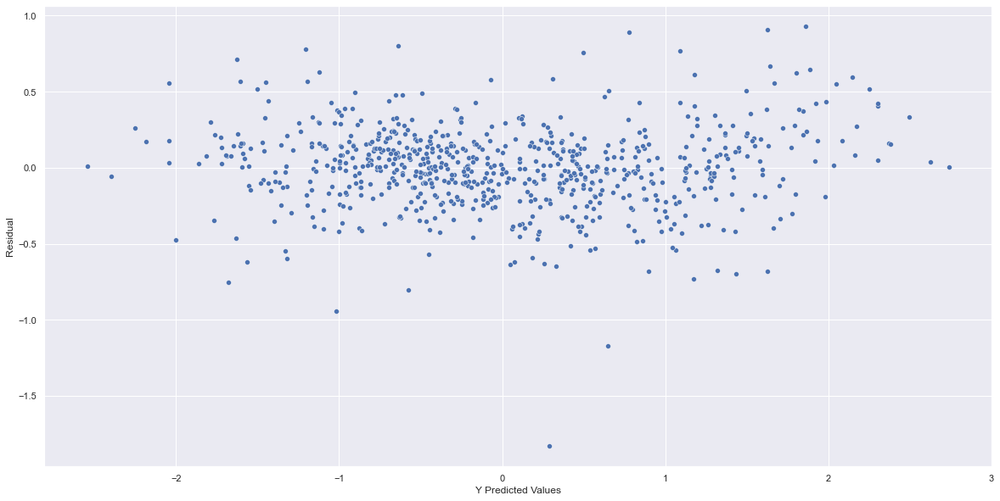

In [119]:
plt.figure(figsize=(20, 10))
sns.scatterplot(y=res_lm, x=y_train_pred_lm)
plt.ylabel('Residual')
plt.xlabel('Y Predicted Values')

Text(0.5, 0, 'Y Predicted Values')

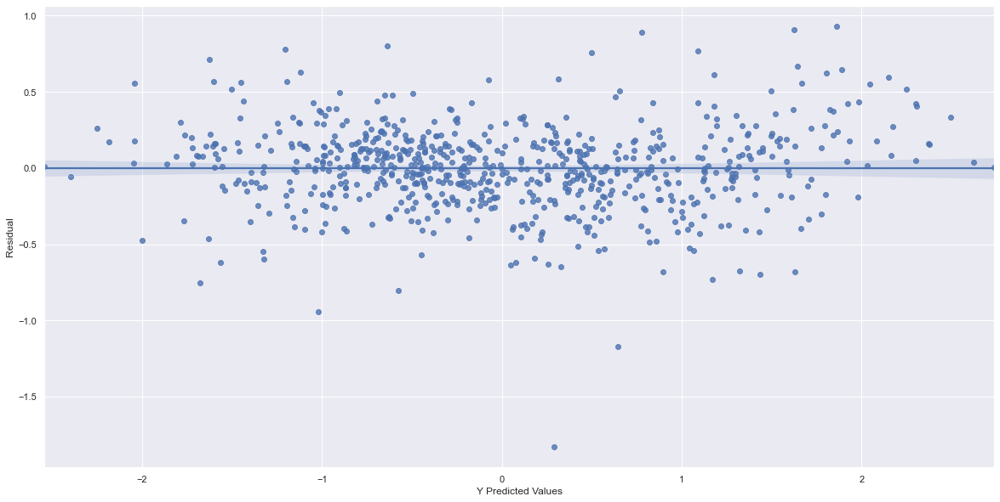

In [120]:
plt.figure(figsize=(20, 10))
sns.regplot(y=res_lm, x=y_train_pred_lm)
plt.ylabel('Residual')
plt.xlabel('Y Predicted Values')

The data is following homoscedasticity, thus conforming our <b>Assumption 3</b>

### Assumption 4: Independence of error

The Graph above proves the independence of error too.<br>
Thus satisfing the <b>Assumption 4</b>

### Using regularisation

## Ridge Regression

In [121]:
folds = 10
params = {'alpha': [0.00001, 0.0001, 0.001, 0.01, 0.05, 0.1, 
 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0, 2.0, 3.0, 
 4.0, 5.0, 6.0, 7.0, 8.0, 9.0, 10.0, 20, 50, 100, 500, 1000 ]}

In [122]:
ridge = Ridge()

# cross validation
model_cv = GridSearchCV(estimator = ridge, 
                        param_grid = params, 
                        scoring= 'neg_mean_absolute_error',  
                        cv = folds, 
                        return_train_score=True,
                        verbose = 1)            
model_cv.fit(X_train, y_train) 

Fitting 10 folds for each of 29 candidates, totalling 290 fits


GridSearchCV(cv=10, estimator=Ridge(),
             param_grid={'alpha': [1e-05, 0.0001, 0.001, 0.01, 0.05, 0.1, 0.2,
                                   0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0, 2.0,
                                   3.0, 4.0, 5.0, 6.0, 7.0, 8.0, 9.0, 10.0, 20,
                                   50, 100, 500, 1000]},
             return_train_score=True, scoring='neg_mean_absolute_error',
             verbose=1)

In [123]:
print(model_cv.best_params_)

{'alpha': 9.0}


In [124]:
alpha_ridge = model_cv.best_params_['alpha']
ridge = Ridge(alpha=alpha_ridge)

ridge.fit(X_train, y_train)
print(ridge.coef_)

[ 2.49078037e-02  9.80524870e-02  1.39155065e-01  1.13921650e-01
 -1.80724699e-01 -1.73922640e-02  1.15336594e-02  3.39681615e-02
 -1.66251729e-02  4.38966443e-02  6.01561339e-02 -1.25338429e-02
  1.51373033e-01  7.11451386e-03  3.59254210e-02  3.46659230e-01
  4.76847259e-02  5.71496774e-03  3.42980911e-02  4.67532274e-02
 -4.73977273e-02 -5.64464412e-02  9.88143453e-02  3.89511060e-02
  1.36183403e-03  3.37032364e-02  7.53877932e-02  5.27671661e-03
  1.94650477e-02  8.09940551e-03 -9.97664978e-04 -2.41105535e-03
  1.55995139e-01 -3.75598622e-02 -3.96828410e-02  3.07520998e-01
 -1.32354845e-01 -1.76522192e-01 -3.34759650e-02 -1.10426006e-01
 -6.39677888e-02 -4.32219823e-02  3.71714826e-02 -1.60315170e-01
  2.50645287e-02  1.18127970e-01 -9.30854623e-02  1.61736287e-02
 -9.25530439e-02 -3.71691956e-02  1.88324426e-01  1.34773359e-01
  5.88118776e-02  8.69708245e-02  1.45435610e-02  6.49569716e-02
  0.00000000e+00 -1.10370901e-02 -2.53987176e-02 -8.17524735e-03
  5.92438630e-02 -4.60432

In [125]:
metric_rigde = getOutputs(ridge, X_train, X_test, y_train, y_test)

0.918041158072153
0.8722347301095975
59.91191344925608
39.61825976779528
0.0819588419278469
0.12617280180826523


### Assumption 1: Linearity
   - As we have seen above Linearity of dependent and indepent error satisfies

### Assumption 2: Normality of Error

Mean of residual: -4.718068161420039e-16
Std Deviation of residual: 0.2862845471342224


Text(0.5, 0, 'residual values')

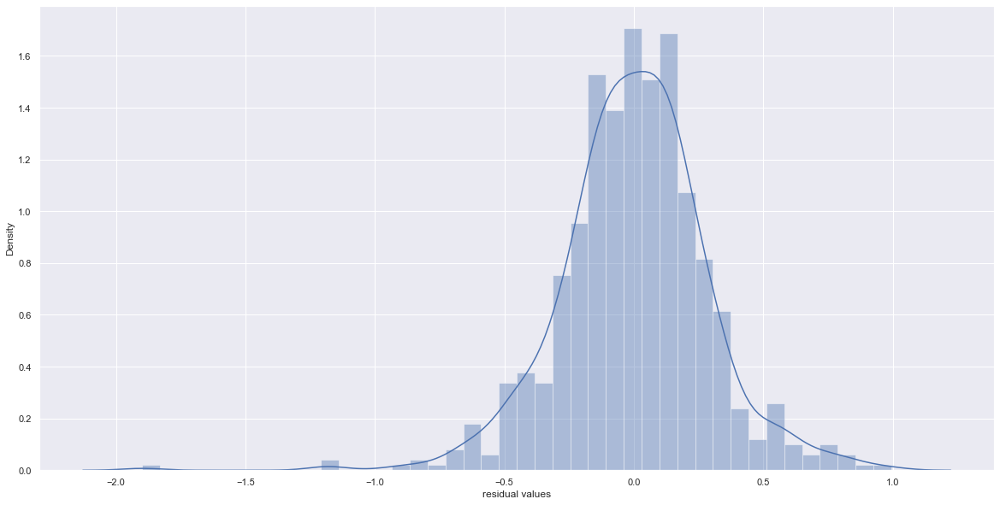

In [126]:
y_train_pred_ridge = ridge.predict(X_train)
res_ridge = y_train-y_train_pred_ridge
print("Mean of residual: {}".format(np.mean(y_train-y_train_pred_ridge)))
print("Std Deviation of residual: {}".format(np.std(res_ridge)))

plt.figure(figsize=(20, 10))
sns.distplot(res_ridge)
plt.xlabel('residual values')

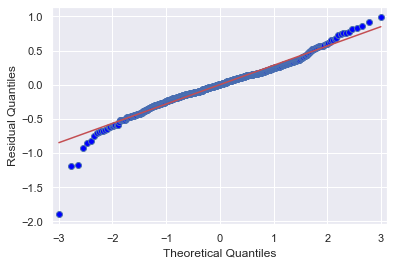

<Figure size 1440x720 with 0 Axes>

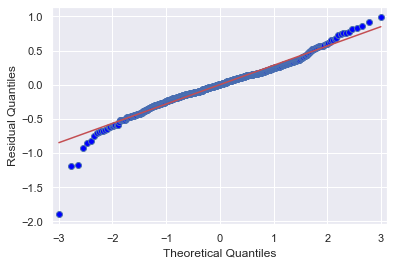

In [127]:
plt.figure(figsize=(20, 10))
sm.qqplot(res_ridge, ylabel = "Residual Quantiles", line="r")

qqplot roughly follows a straight line - proving normality<br>
We can see mean of residual is -3.26^-16, i.e almost zero<br>
SD is close to 1<br>

### Thus our Assumption 2 holds

### Assumption 3: Homoscedasticity

Text(0.5, 0, 'Y Predicted Values')

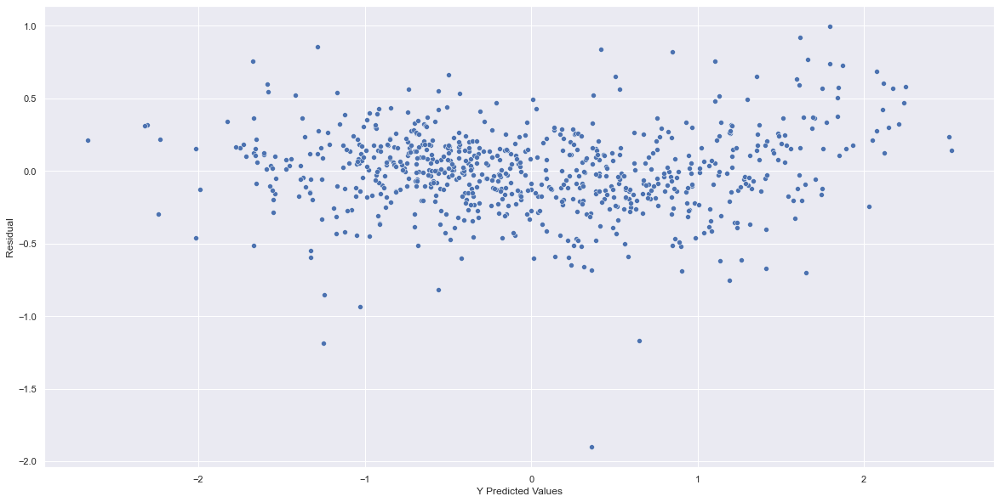

In [128]:
plt.figure(figsize=(20, 10))
sns.scatterplot(y=res_ridge, x=y_train_pred_ridge)
plt.ylabel('Residual')
plt.xlabel('Y Predicted Values')

Text(0.5, 0, 'Y Predicted Values')

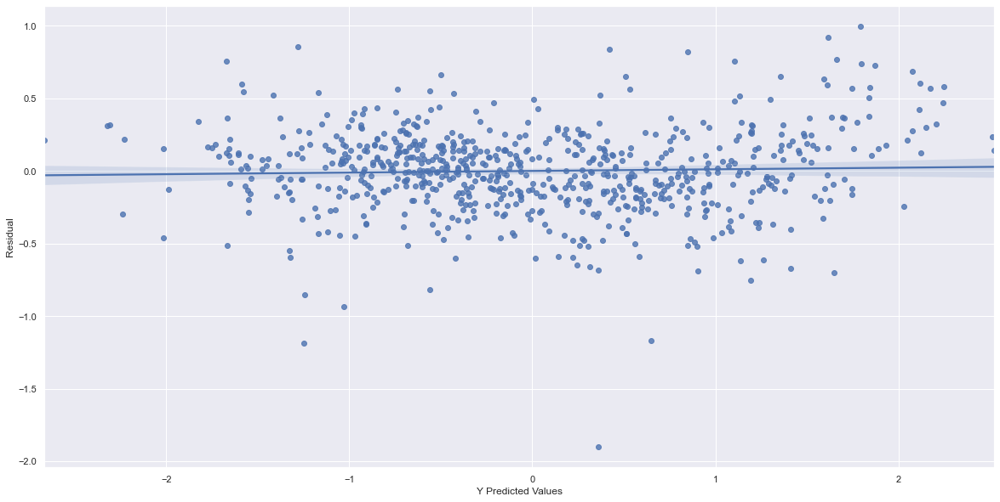

In [129]:
plt.figure(figsize=(20, 10))
sns.regplot(y=res_ridge, x=y_train_pred_ridge)
plt.ylabel('Residual')
plt.xlabel('Y Predicted Values')

The data is following homoscedasticity, thus conforming our <b>Assumption 3</b>

### Assumption 4: Independence of error

The Graph above proves the independence of error too.<br>
Thus satisfing the <b>Assumption 4</b>

## Lasso Regression

In [130]:
lasso = Lasso()

# cross validation
model_cv = GridSearchCV(estimator = lasso, 
                        param_grid = params, 
                        scoring= 'neg_mean_absolute_error', 
                        cv = folds, 
                        return_train_score=True,
                        verbose = 1)            

model_cv.fit(X_train, y_train) 

Fitting 10 folds for each of 29 candidates, totalling 290 fits


GridSearchCV(cv=10, estimator=Lasso(),
             param_grid={'alpha': [1e-05, 0.0001, 0.001, 0.01, 0.05, 0.1, 0.2,
                                   0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0, 2.0,
                                   3.0, 4.0, 5.0, 6.0, 7.0, 8.0, 9.0, 10.0, 20,
                                   50, 100, 500, 1000]},
             return_train_score=True, scoring='neg_mean_absolute_error',
             verbose=1)

In [131]:
# Printing the best hyperparameter alpha
print(model_cv.best_params_)

{'alpha': 0.001}


In [132]:
#Fitting Ridge model for alpha = 100 and printing coefficients which have been penalised

alpha_lasso =model_cv.best_params_['alpha']

lasso = Lasso(alpha=alpha_lasso)
        
lasso.fit(X_train, y_train) 

Lasso(alpha=0.001)

In [133]:
metric_lasso = getOutputs(lasso, X_train, X_test, y_train, y_test)

0.9184490518448372
0.8712705325174007
59.61374310142398
39.917244231318925
0.08155094815516276
0.12712498162840422


### Assumption 1: Linearity
   - As we have seen above Linearity of dependent and indepent error satisfies

### Assumption 2: Normality of Error

Mean of residual: -6.337080123458913e-16
Std Deviation of residual: 0.28557126633322677


Text(0.5, 0, 'residual values')

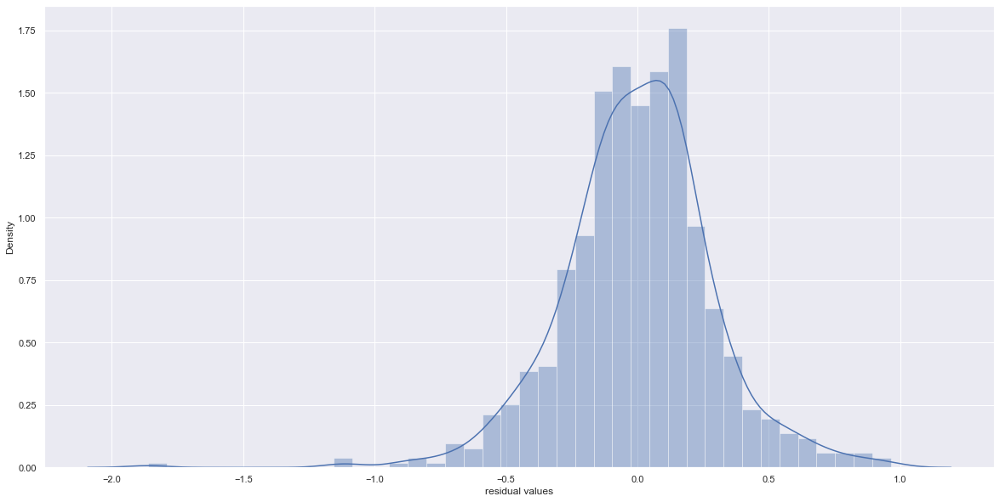

In [134]:
y_train_pred_lasso = lasso.predict(X_train)
res_lasso = y_train-y_train_pred_lasso
print("Mean of residual: {}".format(np.mean(y_train-y_train_pred_lasso)))
print("Std Deviation of residual: {}".format(np.std(res_lasso)))

plt.figure(figsize=(20, 10))
sns.distplot(res_lasso)
plt.xlabel('residual values')

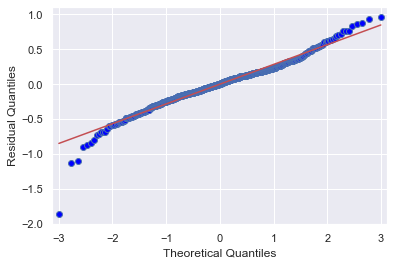

<Figure size 1440x720 with 0 Axes>

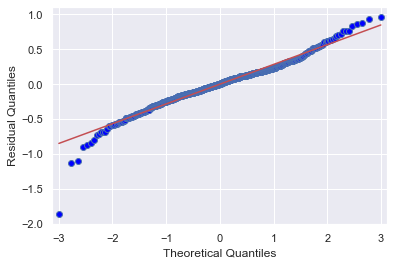

In [135]:
plt.figure(figsize=(20, 10))
sm.qqplot(res_lasso, ylabel = "Residual Quantiles", line="r")

qqplot roughly follows a straight line - proving normality<br>
We can see mean of residual is -3.65^-16, i.e almost zero<br>
SD is close to 1<br>

### Thus our Assumption 2 holds

### Assumption 3: Homoscedasticity

Text(0.5, 0, 'Y Predicted Values')

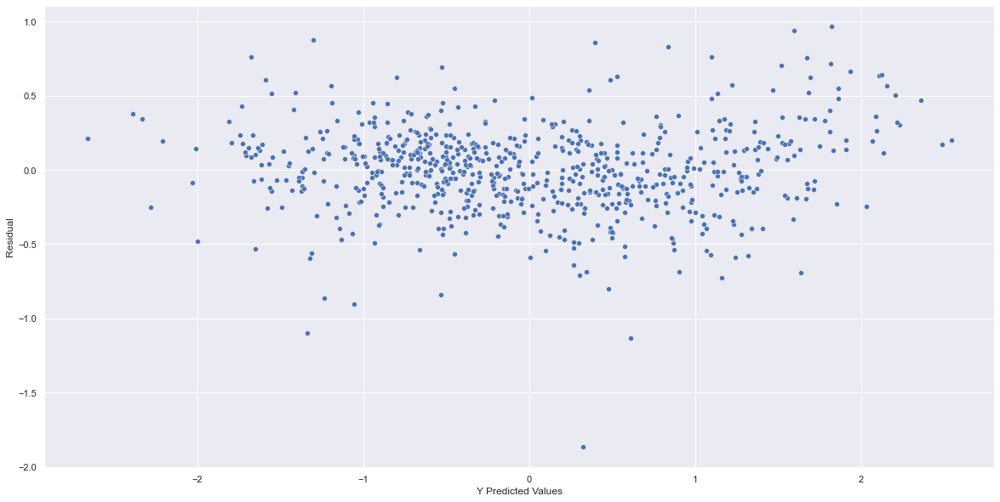

In [136]:
plt.figure(figsize=(20, 10))
sns.scatterplot(y=res_lasso, x=y_train_pred_lasso)
plt.ylabel('Residual')
plt.xlabel('Y Predicted Values')

Text(0.5, 0, 'Y Predicted Values')

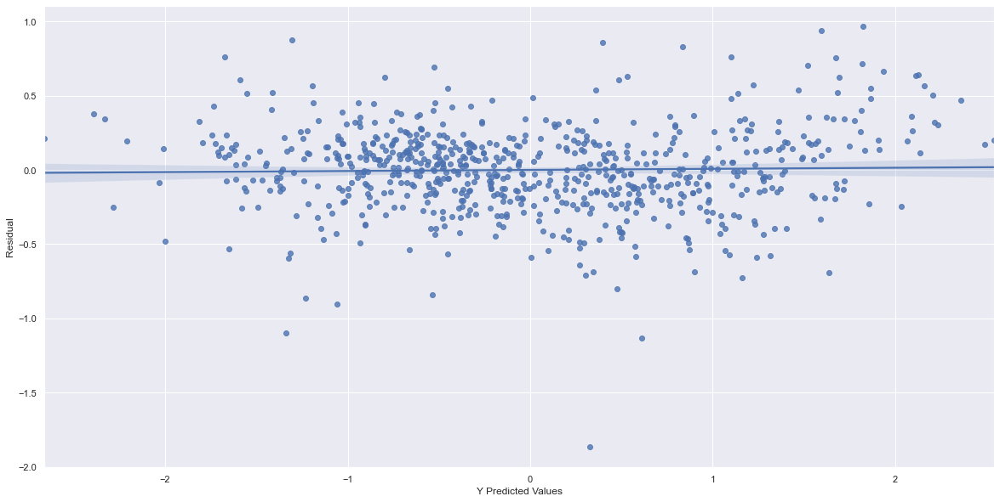

In [137]:
plt.figure(figsize=(20, 10))
sns.regplot(y=res_lasso, x=y_train_pred_lasso)
plt.ylabel('Residual')
plt.xlabel('Y Predicted Values')

The data is following homoscedasticity, thus conforming our <b>Assumption 3</b>

### Assumption 4: Independence of error

The Graph above proves the independence of error too.<br>
Thus satisfing the <b>Assumption 4</b>

## Final Model

In [138]:
lr_table = {'Metric': ['R2 Score (Train)','R2 Score (Test)','RSS (Train)','RSS (Test)',
                       'MSE (Train)','MSE (Test)'], 
        'Linear Regression': metric_lm
        }

lr_metric = pd.DataFrame(lr_table ,columns = ['Metric', 'Linear Regression'] )
rg_metric = pd.Series(metric_rigde, name = 'Ridge Regression')
ls_metric = pd.Series(metric_lasso, name = 'Lasso Regression')

final_metric = pd.concat([lr_metric, rg_metric, ls_metric], axis = 1)

final_metric

,Metric,Linear Regression,Ridge Regression,Lasso Regression
0,R2 Score (Train),9.269717e-01,0.918041,0.918449
1,R2 Score (Test),-1.066579e+23,0.872235,0.871271
2,RSS (Train),5.338366e+01,59.911913,59.613743
3,RSS (Test),3.307315e+25,39.618260,39.917244
4,MSE (Train),2.702374e-01,0.286285,0.285571
5,MSE (Test),3.245435e+11,0.355208,0.356546


In [139]:
betas = pd.DataFrame(index=X_train.columns)
betas.rows = X_train.columns

betas['Linear'] = lm.coef_
betas['Ridge'] = ridge.coef_
betas['Lasso'] = lasso.coef_

pd.set_option('display.max_rows', 10)
betas.head(68)

,Linear,Ridge,Lasso
LotFrontage,0.018486,0.024908,0.012218
LotArea,0.088948,0.098052,0.094528
OverallQual,0.116291,0.139155,0.133734
OverallCond,0.101853,0.113922,0.118393
YearBuilt,-0.164136,-0.180725,-0.197720
...,...,...,...
Foundation_Slab,0.150440,0.078330,0.033858
Foundation_Stone,0.280213,0.040601,0.000000
Foundation_Wood,-0.060445,-0.016298,-0.000000
Exterior2nd_AsphShn,-0.081151,-0.003187,0.000000


In [140]:
len(pd.DataFrame(betas['Ridge'][betas['Ridge']!=0], X_train.columns[betas['Ridge']!=0]).sort_values(by='Ridge'))

147

In [141]:
len(pd.DataFrame(betas['Lasso'][betas['Lasso']!=0], X_train.columns[betas['Lasso']!=0]).sort_values(by='Lasso'))

88

<b>We are choosing lasso Model</b> as we can see that Lasso has only 88 predictor variables as compared to 147 of ridge with no hit to accuracy and lm seems to be overfitting

The final equation will be 

In [142]:
index_list = list(pd.DataFrame(betas['Lasso'][betas['Lasso']!=0], X_train.columns[betas['Lasso']!=0]).sort_values(by='Lasso').index)
eq = ""
for i in index_list:
    if(pd.DataFrame(betas['Lasso'][betas['Lasso']!=0], X_train.columns[betas['Lasso']!=0]).sort_values(by='Lasso').loc[i]['Lasso']>=0):
        eq += '+'
    eq += str(pd.DataFrame(betas['Lasso'][betas['Lasso']!=0], X_train.columns[betas['Lasso']!=0]).sort_values(by='Lasso').loc[i]['Lasso'])+i
eq

'-0.19771960346446343YearBuilt-0.17175665224856004Neighborhood_Gilbert-0.13848401524424614MSSubClass_2-STORY PUD - 1946 & NEWER-0.13757252447959456Neighborhood_NWAmes-0.11410586556085285Neighborhood_MeadowV-0.10682767028825663Neighborhood_Edwards-0.07982848080804288Exterior1st_Wd Sdng-0.06674970868926276LotConfig_FR2-0.06072849580633709KitchenAbvGr-0.05489738451138139Neighborhood_Sawyer-0.051595764982152896MoSold_Mar-0.04380594865603605Neighborhood_OldTown-0.042881973976777385BedroomAbvGr-0.03777178833884974Exterior2nd_HdBoard-0.034467721486057985Exterior1st_Plywood-0.03238717144389264Exterior2nd_Plywood-0.032382103375263434GarageType_Basment-0.02991494434855039BsmtFinType1_Rec-0.023922615039317103Exterior2nd_ImStucc-0.023399363409958723Neighborhood_Mitchel-0.022316675317187087Exterior2nd_Wd Shng-0.01534263666692656BsmtFinType1_LwQ-0.013233472250162186GarageType_Attchd-0.013037240683816644YearRemodAdd-0.01166002401328411LotShape_Reg-0.00581397133880621BsmtUnfSF-0.00496032308823859BsmtQ

## Assignment Questions

### Question 1 Part (What will be the changes in the model if you choose double the value of alpha for both ridge and lasso)

In [143]:
pd.DataFrame(betas['Ridge'][betas['Ridge']!=0], X_train.columns[betas['Ridge']!=0]).sort_values(by='Ridge')

,Ridge
YearBuilt,-0.180725
Neighborhood_Gilbert,-0.176522
Neighborhood_NWAmes,-0.160315
Neighborhood_Edwards,-0.132355
Neighborhood_MeadowV,-0.110426
...,...
TotalBsmtSF,0.151373
Neighborhood_BrkSide,0.155995
Neighborhood_Somerst,0.188324
Neighborhood_Crawfor,0.307521


In [144]:
pd.DataFrame(betas['Lasso'][betas['Lasso']!=0], X_train.columns[betas['Lasso']!=0]).sort_values(by='Lasso')

,Lasso
YearBuilt,-0.197720
Neighborhood_Gilbert,-0.171757
MSSubClass_2-STORY PUD - 1946 & NEWER,-0.138484
Neighborhood_NWAmes,-0.137573
Neighborhood_MeadowV,-0.114106
...,...
Neighborhood_BrkSide,0.224951
Neighborhood_StoneBr,0.253003
Neighborhood_Somerst,0.346901
GrLivArea,0.373418


In [145]:
ridge1 = Ridge(alpha=alpha_ridge*2)
ridge1.fit(X_train, y_train)

_ = getOutputs(ridge1, X_train, X_test, y_train, y_test)

0.9136153090499446
0.870940765473966
63.14720908449051
40.019500473573665
0.08638469095005542
0.12745063845087154


In [146]:
lasso1 = Lasso(alpha=alpha_lasso*2)
lasso1.fit(X_train, y_train) 
_ = getOutputs(lasso1, X_train, X_test, y_train, y_test)

0.9132163052982605
0.8691864615654816
63.438880826971605
40.563486081067886
0.08678369470173954
0.129183076691299


In [147]:
quebetas = pd.DataFrame(index=X_train.columns)
quebetas.rows = X_train.columns

quebetas['Ridge'] = ridge1.coef_
quebetas['Lasso'] = lasso1.coef_

pd.set_option('display.max_rows', 10)
quebetas.head(68)

,Ridge,Lasso
LotFrontage,0.028735,0.017350
LotArea,0.098063,0.097694
OverallQual,0.145068,0.138985
OverallCond,0.110720,0.117008
YearBuilt,-0.172702,-0.208617
...,...,...
Foundation_Slab,0.057703,0.000000
Foundation_Stone,0.022797,0.000000
Foundation_Wood,-0.008734,-0.000000
Exterior2nd_AsphShn,-0.000066,-0.000000


In [148]:
pd.DataFrame(quebetas['Ridge'][quebetas['Ridge']!=0], X_train.columns[quebetas['Ridge']!=0]).sort_values(by='Ridge')

,Ridge
YearBuilt,-0.172702
Neighborhood_Gilbert,-0.138629
Neighborhood_NWAmes,-0.119192
Neighborhood_Edwards,-0.104552
Neighborhood_OldTown,-0.087078
...,...
Neighborhood_Somerst,0.141623
OverallQual,0.145068
TotalBsmtSF,0.146693
Neighborhood_Crawfor,0.230250


In [149]:
pd.DataFrame(quebetas['Lasso'][quebetas['Lasso']!=0], X_train.columns[quebetas['Lasso']!=0]).sort_values(by='Lasso')

,Lasso
YearBuilt,-0.208617
Neighborhood_Gilbert,-0.137086
Neighborhood_NWAmes,-0.111858
MSSubClass_2-STORY PUD - 1946 & NEWER,-0.088208
Neighborhood_Edwards,-0.075746
...,...
Exterior1st_BrkFace,0.185815
Neighborhood_BrkSide,0.212055
Neighborhood_Somerst,0.308881
GrLivArea,0.381225


### Question 3

In [150]:
pd.DataFrame(betas['Lasso'][betas['Lasso']!=0], X_train.columns[betas['Lasso']!=0]).sort_values(by='Lasso')

,Lasso
YearBuilt,-0.197720
Neighborhood_Gilbert,-0.171757
MSSubClass_2-STORY PUD - 1946 & NEWER,-0.138484
Neighborhood_NWAmes,-0.137573
Neighborhood_MeadowV,-0.114106
...,...
Neighborhood_BrkSide,0.224951
Neighborhood_StoneBr,0.253003
Neighborhood_Somerst,0.346901
GrLivArea,0.373418


In [151]:
#Top 5 features for lasso are 
"""
1. Neighborhood_Crawfor
2. GrLivArea
3. Neighborhood_Somerst
4. Neighborhood_StoneBr
5. Neighborhood_BrkSide
"""


lasso_new = Lasso()
X_train_new = X_train.drop(['Neighborhood_Crawfor', 'GrLivArea', 'Neighborhood_Somerst', 'Neighborhood_StoneBr', 'Neighborhood_BrkSide'], axis=1)
X_test_new = X_test.drop(['Neighborhood_Crawfor', 'GrLivArea', 'Neighborhood_Somerst', 'Neighborhood_StoneBr', 'Neighborhood_BrkSide'], axis=1)

# cross validation
model_cv = GridSearchCV(estimator = lasso_new, 
                        param_grid = params, 
                        scoring= 'neg_mean_absolute_error', 
                        cv = folds, 
                        return_train_score=True,
                        verbose = 1)            
# neg_mean_absolute_error
model_cv.fit(X_train_new, y_train)

alpha =model_cv.best_params_['alpha']
print(alpha)
lasso_new = Lasso(alpha=alpha)
        
lasso_new.fit(X_train_new, y_train) 

_ = getOutputs(lasso_new, X_train_new, X_test_new, y_train, y_test)

Fitting 10 folds for each of 29 candidates, totalling 290 fits
0.001
0.9014239381125431
0.87174678329982
72.05910123973104
39.769565388479336
0.09857606188745696
0.12665466684229088


In [152]:
betas1 = pd.DataFrame(index=X_train_new.columns)
betas1.rows = X_train_new.columns

betas1['Lasso'] = lasso_new.coef_

pd.set_option('display.max_rows', 10)
pd.DataFrame(betas1['Lasso'][betas1['Lasso']!=0], X_train_new.columns[betas1['Lasso']!=0]).sort_values(by='Lasso')

,Lasso
Neighborhood_Gilbert,-0.398525
Neighborhood_NWAmes,-0.321965
Neighborhood_MeadowV,-0.315915
Neighborhood_Edwards,-0.276911
Neighborhood_Sawyer,-0.265517
...,...
MSZoning_FV,0.235810
Exterior2nd_CmentBd,0.270716
2ndFlrSF,0.284268
TotalBsmtSF,0.322079


In [153]:
"""
1. BsmtFinType1_NA
2. Neighborhood_Gilbert
3. TotalBsmtSF
4. Neighborhood_NWAmes
5. Neighborhood_MeadowV
"""

'\n1. BsmtFinType1_NA\n2. Neighborhood_Gilbert\n3. TotalBsmtSF\n4. Neighborhood_NWAmes\n5. Neighborhood_MeadowV\n'

## Observation
   - Train accuracy is at 91.8
   - Test accuracy is at 87.1
   - The equation we need to consider is mentioned above

## Conclusion
   - We see that most highly influencial features are
     - Neighbouhood
     - Ground level living area
     - basement area
     - Are of the house